# Data Mining Assignment 2

# Introduction


### Contextualizing the Problem

Data mining is an essential practice for uncovering patterns and insights from large datasets, enabling businesses to make data-driven decisions. This approach is valuable in marketing, where understanding customer behavior can lead to more targeted campaigns and optimized resource allocation.

In 2023, successful marketing campaigns' median profit-based return on investment (ROI) worldwide reached 2.43 U.S. dollars, meaning global advertisers profited, on average, 2.43 dollars for every dollar they spent on those strategies (Statista, 2024). This highlights the key role played by marketing campaigns in increasing the profitability of an organisation.

This project focuses to apply data mining techniques to the marketing domain, specifically focusing on a dataset provided by a food delivery company that offers various product categories through multiple sales channels. The dataset is derived from Kaggle repository. It includes the demographic data gathered from 2,240 customers who were randomly selected to promote a product, the results recorded as customer responses (purchases or non-purchases) for five marketing campaigns conducted by a company, the amount spent on multiple product categories and the sales channel used to make the purchase.

Despite generating revenue from respondents, the overall campaign ran at a loss. So, our project focuses on analyzing how to make the next hypothetical promotion a success by filtering the targeting audience. 

### Business Understanding and Objectives of the Project

iFood is a popular food delivery company which has its footprint in over a thousand cities with more than a million registered users on its app. Customers can buy products from 5 categories in this application namely: wines, rare meats, fish, exotic fruits and sweet products. These 5 categories are further categorized gold and regular products. These products can be purchased via physical stores or catalogs or company website. 

The company had a decent run so far but, is concerned about its future as the profit growth projection for the next 3 years seems to be declining which is alarming. So, the company is trying to incorporate innovative ways to Market its products hoping to improve the user engagement which could improve the overall revenue and profits. Due to the budget constraints of the marketing department, it is crucial to make every marketing move explainable to the CMO which is why a more quantitative approach using data driven insights are key.

<div style="text-align: center;">
    <img src="https://i.imgur.com/mXXqAHU.jpeg" alt="Flow Diagram" style="width:720px;height:200px;">
</div>

Figure 1: Business Use Case Sample Diagram

So far, marketing team have conducted 5 campaigns to promote a product which turned out to be a failure as it incurred a net loss of 3.046MU overall with a success rate as low as 15%. Nevertheless, the company plans to promote a new product using the data it accumulated through the previous campaigns using which they plan to identify the customers who are most likely to redeem the offers and do a targeted promotion, to increase the overall success rate of the campaign. Using the insights obtained through data mining techniques this niche customer base.

The main business objective here for the marketing team is to predict the customers who would make use of the promotion as accurate as possible to improve the ROI of the campaign, which means the True Positive needs to be high. So, we focus on the `F1-Score` in this project and use it as a KPI to measure the success rate in identifying customers that uses the offer.

### Problem Statement

In this project we used a combination of data mining techniques like classification, clustering, and association rule mining to majorly identify customer segments and to perform targeted marketing campaigns. However, the problem statements are divided to 3 based on the technique to be used to solve it. Such as:

`Classification:` **Given the data from a sample marketing campaign, how can we accurately predict which customers are most likely to respond to future campaigns?**

`Clustering Analyis` **What are the distinct customer segments based on their demographic information, purchasing behavior, and campaign response?**

`Association Analysis:` **Are there associations between certain demographic features (e.g., marital status, number of children) and purchasing preferences?**

### Data Mining Methodology: CRISP-DM Approach

To ensure a systematic and effective analysis, we will adopt the CRISP-DM (Cross-Industry Standard Process for Data Mining) framework. This method structures the project into six key phases:

<div style="text-align: center;">
    <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/b/b9/CRISP-DM_Process_Diagram.png/639px-CRISP-DM_Process_Diagram.png" alt="CRISP-DM Process" style="width:400px;height:400px;margin-top: 20px;">
</div>

Figure 2: CRISP-DM Process Diagram 

1. Business Understanding: The project’s goals and success criteria will be defined here, which will be focused on predicting customer responses and maximizing campaign profit. The aim is to shortlist the target audience who are more likely to participle in an upcoming campaign that improves the return on investment (ROI).

2.  Data Understanding: This step involves exploring the dataset (by checking for outliers, correlations etc.) to identify the quality of data. The dataset is obtained from Kaggle repository which contains 2,240 observations with 29 features. The dataset includes socio-demographic, response and campaign participation data of customers who were randomly selected to participate in campaigns conducted to promote a product.

3.  Data Preparation: This is a pivotal phase in which we prepare the dataset for modeling by handling missing values, outliers, and multicolinearity. Also transformation of data will be done in this phase by applying advanced feature engineering techniques like scaling, standardization or normalization, etc. which will also enhance the model's performance.

4.  Modeling: Since this is a classification problem multiple predictive models such as random forest, artificial neural network, gradient boosting and logistic regression are employed. The dataset will be divided into 2 parts namely training and testing set. The modelling techniques will be applied on the training set. Then, we apply hyperparameter tuning using gridsearch and run the models again using the best parameters.

5.  Evaluation: In this step, all the models will be assessed based on the success criteria discussed in business objective i.e. to have a high `F1-score`. However, since we would not want to be dependent only on one metric, we also consider other metrics like `accuracy` and ROC curve, for example. The models will be compared against each other in terms of these metrics and the best model which satisfies both the data mining and business goals will be finalized.

6.  Deployment: This step is omitted.


### Importing modules

In [1]:
import os
import datetime
import warnings
import inflection
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, 
                             roc_auc_score, confusion_matrix, classification_report, 
                             silhouette_score)
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
from scikeras.wrappers import KerasClassifier
from mlxtend.frequent_patterns import fpgrowth, association_rules
from scipy.cluster.hierarchy import linkage, dendrogram, cut_tree


warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

DATA_YEAR = datetime.datetime(year=2015, month=1, day=1)


### Data Understanding

The diagram below outlines the high-level approach to the upcoming steps that we will take

<div style="text-align: center;">
    <img src="https://i.imgur.com/K0icFsx.png" alt="Flow Diagram" style="width:600px;height:200px;">
</div>
Figure 1: Data Transformation and preparation overview

In [2]:
# First create the folder "data" and add the data source into it
def check_data_folder_dataset_load_df(dataset_csv_name="marketing_campaign.csv"):
    if not os.path.isdir("data"):
        raise Exception("there is no data folder ")
    if not os.path.exists(f"data/{dataset_csv_name}"):
        raise Exception(f"there is no {dataset_csv_name} in the data folder ")
    
    return pd.read_csv(f"data/{dataset_csv_name}", delimiter=";")
    
df = check_data_folder_dataset_load_df()
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0


From the initial impressions of the data, a notable limitation observed is that it focuses on the amount spent by customers across various product categories without detailing the specific items purchased. This restricts our analysis to aggregate spending behavior rather than getting detailed insights into product preferences or trends. So, we cannot determine which specific products are driving purchases or campaign responses.

Also, it is understandable that variables like AcceptedCmp1, AccemptedCmp2 etc. determines if a user have redeemed a promotional offer. If these promotions are done via online advertisements, it would be nice to have additional metadata like number of clicks (users who clicked on the offer but not claimed it) and number of claims(users who claimed the promotion but not redeemed it). This information can be useful to understand how much time a user is spending on a promotion and how to successfully convert them to claiming and redeeming.

We can look at the descriptive statistics of the dataframe below:

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

The dataset contains 29 columns and 2240 rows. The column descriptions can be found below:

1. ID - Customer’s id
2. Year_Birth - Customer’s year of birth
3. Education - Customer’s level of education
4. Marital_Status - Customer’s marital status
5. Income - Customer’s yearly household income
6. Kidhome - Number of small children in customer’s household
7. Teenhome - Number of teenagers in customer’s household
8. Dt_Customer - Date of customer’s enrolment with the company
9. Recency - Number of days since the last purchase
10. MntWines - Amount spent on wine products in the last 2 years
11. MntFruits - Amount spent on fruits products in the last 2 years
12. MntMeatProducts - Amount spent on meat products in the last 2 years
13. MntFishProducts - Amount spent on fish products in the last 2 years
14. MntSweetProducts - Amount spent on sweet products in the last 2 years
15. MntGoldProds - Amount spent on gold products in the last 2 years
16. NumDealsPurchases - Number of purchases made with discount
17. NumWebPurchases - Number of purchases made through company’s web site
18. NumCatalogPurchases - Number of purchases made using catalogue
19. NumStorePurchases - Number of purchases made directly in stores
20. NumWebVisitsMonth - Number of visits to company’s web site in the last month
21. AcceptedCmp3 - 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
22. AcceptedCmp4 - 1 if customer accepted the offer in the 4th campaign, 0 otherwise
23. AcceptedCmp5 - 1 if customer accepted the offer in the 5th campaign, 0 otherwise
24. AcceptedCmp1 - 1 if customer accepted the offer in the 1st campaign, 0 otherwise
25. AcceptedCmp2 - 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
26. Complain - 1 if customer complained in the last 2 years, 0 otherwise
27. Z_CostContact - Cost to contact a customer
28. Z_Revenue - Revenue after client accepting campaign
29. Response (target) - 1 if customer accepted the offer in the last campaign, 0 otherwise

From this we can see that `Education`, `Marital_Status` and `Dt_customer` are non numeric values.

Now we can take a look at the descriptive statistics of the numerical values:

In [4]:
df.describe().transpose().round(2)

,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.16,3246.66,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,2240.0,1968.81,11.98,1893.0,1959.00,1970.0,1977.00,1996.0
Income,2216.0,52247.25,25173.08,1730.0,35303.00,51381.5,68522.00,666666.0
Kidhome,2240.0,0.44,0.54,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.51,0.54,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.11,28.96,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.94,336.60,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.30,39.77,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.95,225.72,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.53,54.63,0.0,3.00,12.0,50.00,259.0


We can check for missing values in the dataset:

In [5]:
print("Missing data in the dataframe:")
print(df.isnull().sum())

Missing data in the dataframe:
ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64


Since 1% of the columns have Null values in them, we can safely remove them:

In [6]:
df = df.dropna()

Now, for consistency sake we transform all column names into camelcase

In [7]:
df.columns = [inflection.underscore(col) for col in df.columns]
df.columns

Index(['id', 'year_birth', 'education', 'marital_status', 'income', 'kidhome',
       'teenhome', 'dt_customer', 'recency', 'mnt_wines', 'mnt_fruits',
       'mnt_meat_products', 'mnt_fish_products', 'mnt_sweet_products',
       'mnt_gold_prods', 'num_deals_purchases', 'num_web_purchases',
       'num_catalog_purchases', 'num_store_purchases', 'num_web_visits_month',
       'accepted_cmp3', 'accepted_cmp4', 'accepted_cmp5', 'accepted_cmp1',
       'accepted_cmp2', 'complain', 'z_cost_contact', 'z_revenue', 'response'],
      dtype='object')

We can also check for the amount of unique values per column in our dataset, to see if maybe some data is redundant:

In [8]:
df.nunique()

id                       2216
year_birth                 59
education                   5
marital_status              8
income                   1974
kidhome                     3
teenhome                    3
dt_customer               662
recency                   100
mnt_wines                 776
mnt_fruits                158
mnt_meat_products         554
mnt_fish_products         182
mnt_sweet_products        176
mnt_gold_prods            212
num_deals_purchases        15
num_web_purchases          15
num_catalog_purchases      14
num_store_purchases        14
num_web_visits_month       16
accepted_cmp3               2
accepted_cmp4               2
accepted_cmp5               2
accepted_cmp1               2
accepted_cmp2               2
complain                    2
z_cost_contact              1
z_revenue                   1
response                    2
dtype: int64

From above we acn see `z_cost_contact` and `z_revenue` columns have only one value, as such we can drop those columns

In [9]:
df = df.drop(columns=['z_cost_contact', 'z_revenue'])

### Pairplot

In [10]:
# Selects response and continuous numeric columns with >3 unique values (e.g., excludes discrete variables like 'kidhome', 'teenhome'), ignoring 'id'
numerical_features = [col for col in df if col == 'response' or (df[col].dtype.kind in 'fi' and df[col].nunique() > 3) and col != 'id']

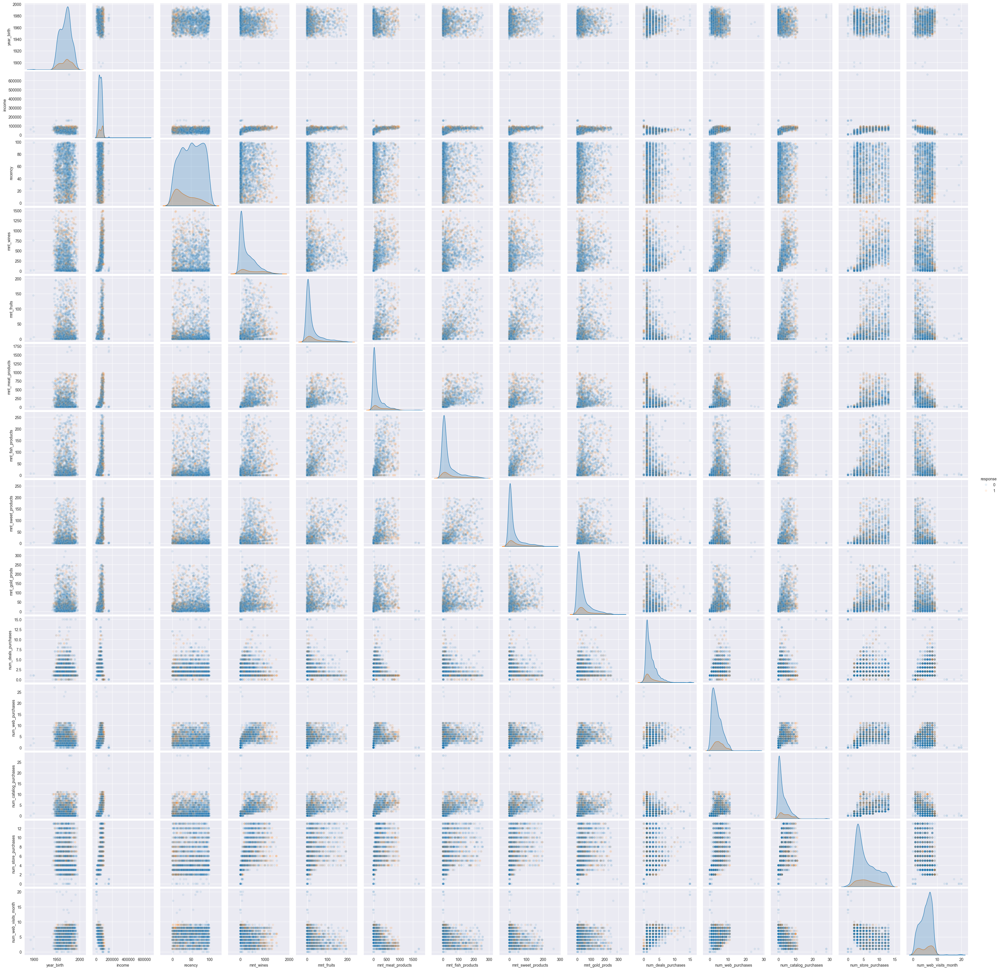

In [11]:
# Numerical Pairplot according to response variable
sns.pairplot(df[numerical_features], hue='response', plot_kws={'alpha':0.1})
plt.show()

The pair plot image shows that many of the numerical features exhibit right skewed distributions, which indicates potential issues with normality. This skewness suggests that applying transformation techniques like log scaling could help normalize these distributions for better model performance. So, we applied log scaling at a later step.

### Histogram

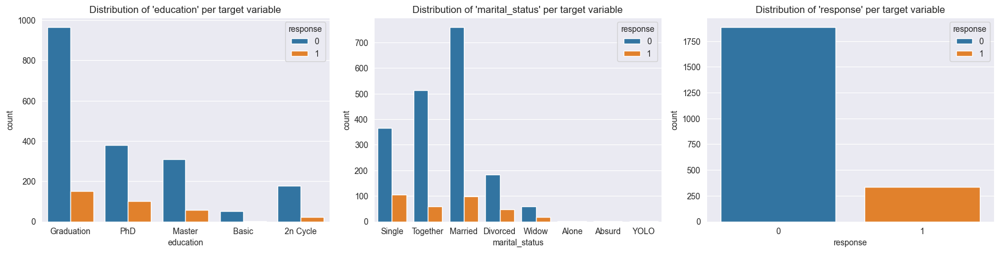

In [12]:
def create_histograms(df, columns, rows=1, cols=2):
    fig, axes = plt.subplots(rows, cols, figsize=(17, 8))
    axes = axes.flatten()  # Flatten to easily index in a loop

    for i, column in enumerate(columns):
        sns.countplot(data=df, x=column, hue='response', ax=axes[i])
        axes[i].set_title(f"Distribution of '{column}' per target variable")

    # Remove any empty subplots if there are fewer columns than grid spaces
    for j in range(i + 1, rows * cols):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Example usage
df_categorical_variables = df[['education', 'marital_status', 'response']]
create_histograms(df_categorical_variables, df_categorical_variables.columns, rows=2, cols=3)

The histograms show that the majority of customers who responded to the campaign have `Graduation` or `PhD` education levels and are predominantly `Married` or `Together` in marital status. Overall, the response distribution is imbalanced, with far more people not responding than those who did.

### Checking Outliers

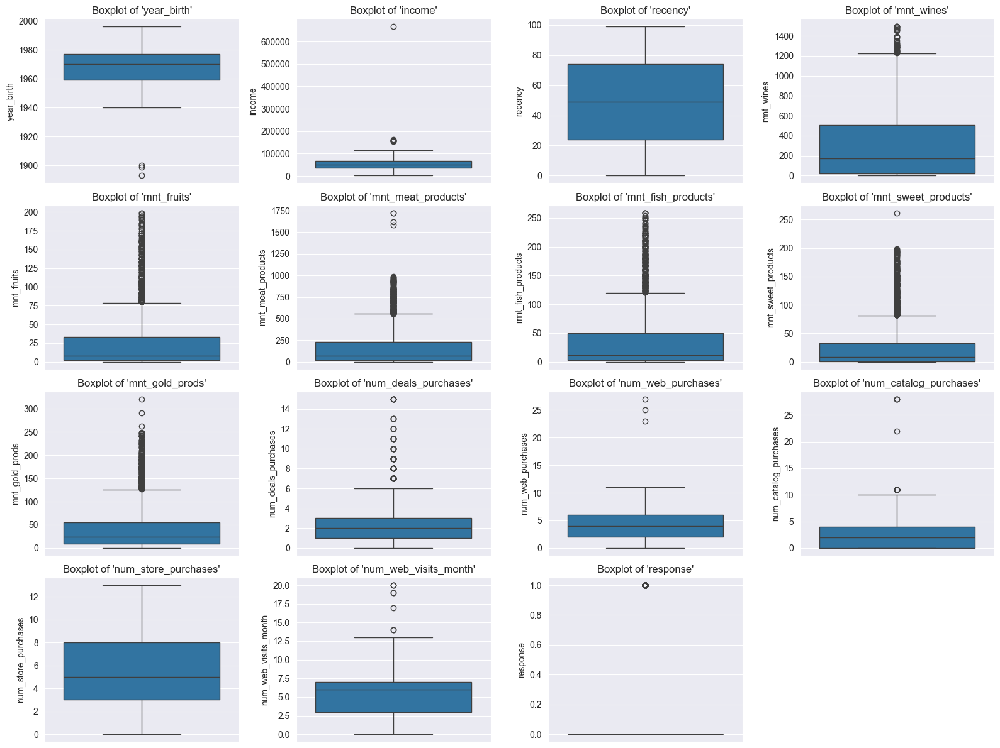

In [13]:
def create_boxplots(df, columns, rows=2, cols=2):
    fig, axes = plt.subplots(rows, cols, figsize=(rows*4, cols*3))
    axes = axes.flatten()  # Flatten to easily index in a loop

    for i, column in enumerate(columns):
        sns.boxplot(data=df, y=column, ax=axes[i])
        axes[i].set_title(f"Boxplot of '{column}'")

    # Remove any empty subplots if there are fewer columns than grid spaces
    for j in range(i + 1, rows * cols):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

create_boxplots(df, numerical_features, rows=4, cols=4)

For age and income we consider to remove the outliers as it is abnormal to target someone with income as high as 700,000 or who is as old as 120 years to be participating in a promotional campaign. Also, it must be noted that the data points that fall in these categories are not too many which is indicated by the light colored border of the outliers. So, the data loss is almost negligible.

Removing the outliers for other features is not suggested as it can result in not being able to apply our model with values falling in these ranges and also the values are not so abnormal to not be existing for these features.

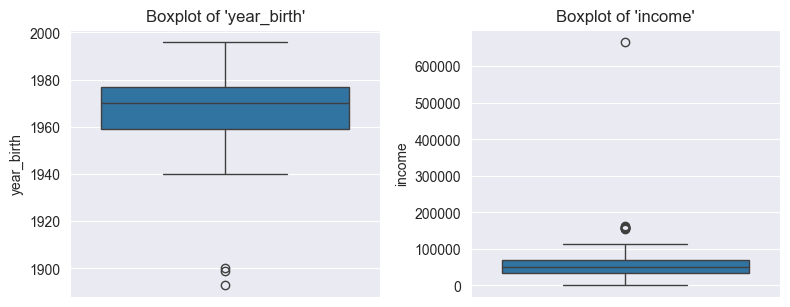

In [14]:
create_boxplots(df, ['year_birth', 'income'])

# Removing outliers
We would like to remove extremely poor or extremely rich customers from the data. 
Also we would like to remove extremely old and young people from the data. These would not help to give representable results downstream

In [15]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    # Define the lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter the dataframe to only include values within the bounds
    df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df

print("Number of rows before removing outliers:", df.shape[0])
df = remove_outliers(df, 'income')
df = remove_outliers(df, 'year_birth')
print("Number of rows after removing outliers:", df.shape[0])

Number of rows before removing outliers: 2216
Number of rows after removing outliers: 2205


### Feature Engineering

Lets add some extra information based on the dataset. 

In [16]:
df

,id,year_birth,education,marital_status,income,kidhome,teenhome,dt_customer,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0


### Add the column months as customer
How many months a customer has been a customer is represented by the months_as_customer columns

In [17]:
# Add a new column age to the dataset
df['age'] = DATA_YEAR.year - df['year_birth']

df['dt_customer'] = pd.to_datetime(df['dt_customer'], format='%Y-%m-%d')
df['months_as_customer'] = 0
for index, row in df.iterrows():
   months_as_customer = round((DATA_YEAR - row['dt_customer']).days/30)
   df.at[index, "months_as_customer"] = months_as_customer

In [18]:
# Add a new column to calculate the total amount spent by each customer for every product
df['total_spend'] = df['mnt_wines'] + df['mnt_fruits'] + df['mnt_meat_products'] + df['mnt_fish_products'] + df['mnt_sweet_products'] + df['mnt_gold_prods']

# Add a new column to calculate the total purchases made by each customer
df['total_purchases'] = df['num_deals_purchases'] + df['num_web_purchases'] + df['num_catalog_purchases'] + df['num_store_purchases']

# Add a new column to calculate the total number of campaign responses made by each customer
df['total_accepted_cpm'] = df['accepted_cmp1'] + df['accepted_cmp2'] + df['accepted_cmp3'] + df['accepted_cmp4'] + df['accepted_cmp5']

# Add a new column to check if the customer is a parent or not as a boolean
df['is_parent'] = ((df['kidhome'] > 0) | (df['teenhome'] > 0)).astype(int)

# Add a new column to split the marital status 
couple_status_mapping = {
    'Married': 1,
    'Together': 1,
    'Single': 0,
    'Divorced': 0,
    'Widow': 0,
    'Alone': 0,
    'Absurd': 0,
    'YOLO': 0
}
df['is_couple'] = df['marital_status'].map(couple_status_mapping)

# Create dummy variables for the 'education' column
education_dummies = pd.get_dummies(df['education'].str.lower(), prefix='education', dtype=int, drop_first=True)
df = pd.concat([df, education_dummies], axis=1)

df.head()

,id,year_birth,education,marital_status,income,kidhome,teenhome,dt_customer,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,response,age,months_as_customer,total_spend,total_purchases,total_accepted_cpm,is_parent,is_couple,education_basic,education_graduation,education_master,education_phd
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,58,28,1617,25,0,0,0,0,1,0,0
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,61,10,27,6,0,1,0,0,1,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,50,17,776,21,0,0,1,0,1,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,31,11,53,8,0,1,1,0,1,0,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,34,12,422,19,0,1,1,0,0,0,1


Below we can now drop the redundant features because we transformed these variables into new variables:

In [19]:
df = df.drop(columns=['id', 'education', 'marital_status', 'year_birth', 'dt_customer'])

Now, checking the correlation:

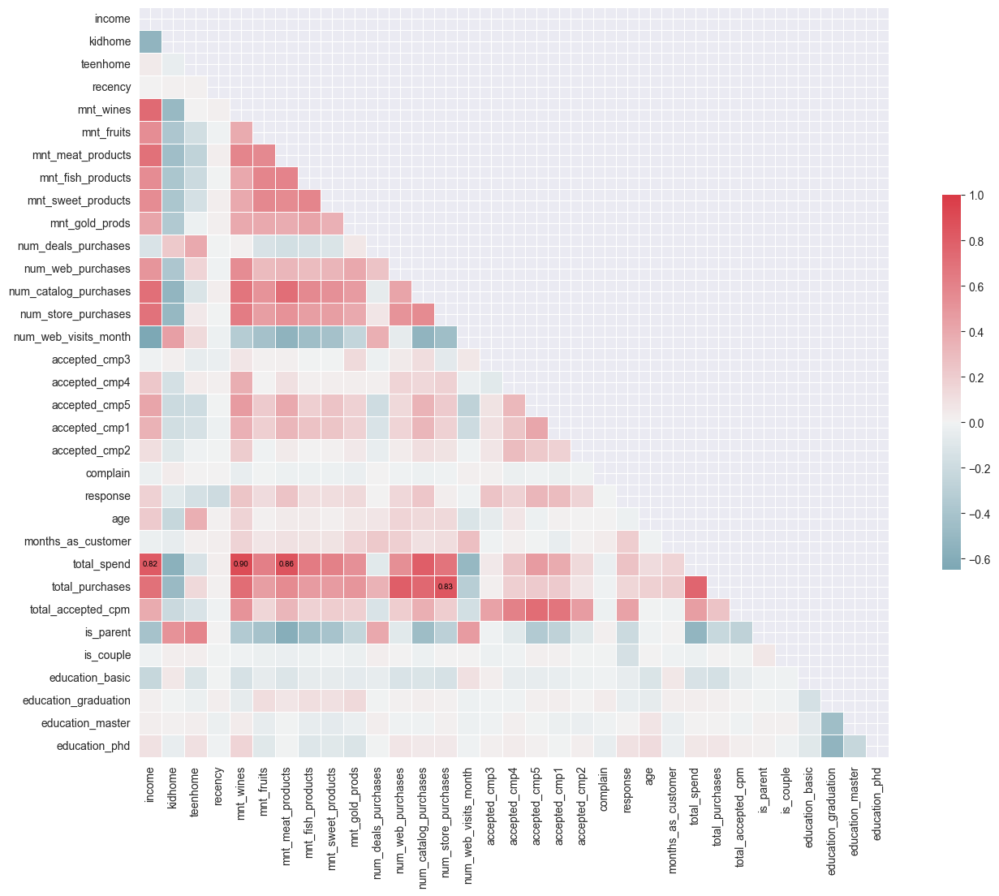

In [20]:
# Calculate corr
corr = df.corr()
# Mask for upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
# Set up the matplotlib figure
plt.figure(figsize=(17, 12))

# Create an annotation matrix with conditions for values above 0.8 or below -0.8
annot = corr.applymap(lambda x: f"{x:.2f}" if abs(x) >= 0.8 else "")

# Draw the heatmap with the mask, annotations, and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=annot, fmt="", annot_kws={"size": 7, "color": "black"})

plt.show()

The correlation matrix shows that a few features are highly correlated, such as `total_spend` with `mnt_wines` and `total_purchases` with `num_store_purchases`, which makes sense as higher spending and more purchases naturally relate to customer activity. While these correlations might suggest redundancy, these features are pivotal for understanding overall purchasing behavior and campaign targeting. Retaining them is crucial for campaign analysis and response predictions.

We can look at our target variable standalone.

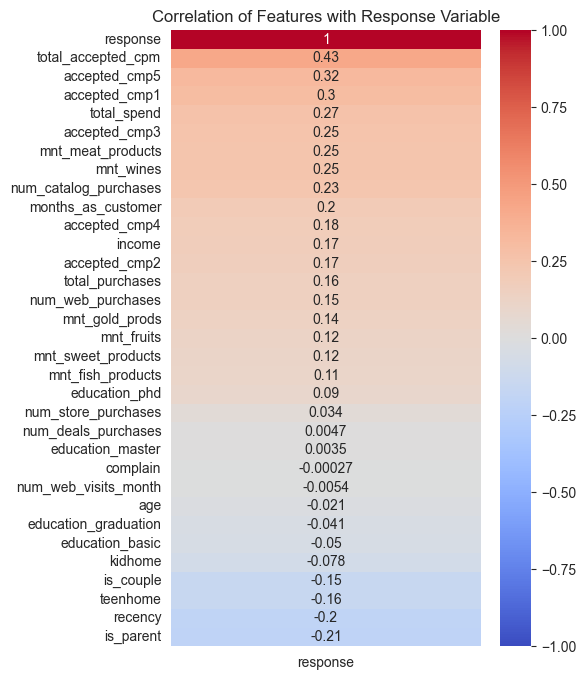

In [21]:
plt.figure(figsize=(5, 8))
sns.heatmap(corr[['response']].sort_values(by='response', ascending=False), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation of Features with Response Variable')
plt.show()

The correlation matrix on `response` variable shows that `total_accepted_cmp` has the strongest correlation (0.43) with it, indicating that previous campaign acceptance is a significant predictor. But no features have extremely high positive or negative correlations with `response`. This is a positive sign, as it indicates no single variable dominates the model, which reduces the risk of multicollinearity and reliance on a single feature. 

The spread of correlations suggests that various features contribute moderately, allowing a more balanced approach for classification.

### Normalization and scaling step 

In [22]:
# Update to the numerical features
numerical_features = ['income', 'recency', 'mnt_wines', 'mnt_fruits', 'mnt_meat_products', 'mnt_fish_products', 
                               'mnt_sweet_products', 'mnt_gold_prods', 'num_deals_purchases', 'num_web_purchases', 
                               'num_catalog_purchases', 'num_store_purchases', 'num_web_visits_month', 'age', 
                               'months_as_customer', 'total_spend', 'total_purchases']

# Apply log transformation to specified features (that are right-skewed)
log_features = ['income', 'mnt_wines', 'mnt_fruits', 'mnt_meat_products', 'mnt_fish_products', 
                'mnt_sweet_products', 'mnt_gold_prods', 'num_deals_purchases', 'num_web_purchases', 
                'num_catalog_purchases', 'total_spend']

# Get the numerical features that are not in the log_features list
numerical_features_no_log = [feature for feature in numerical_features if feature not in log_features]

# Apply the log transformation
df[log_features] = df[log_features].apply(lambda x: np.log1p(x))

# Initialise the scaler
scaler = MinMaxScaler()

# Apply the scaler to the numerical features
df_normalized = df.copy()
# Apply the scaler to the numerical features that were not log-transformed
df_normalized[numerical_features_no_log] = scaler.fit_transform(df[numerical_features_no_log])
df_normalized.head()

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,response,age,months_as_customer,total_spend,total_purchases,total_accepted_cpm,is_parent,is_couple,education_basic,education_graduation,education_master,education_phd
0,10.970592,0,0,0.585859,6.455199,4.488636,6.304449,5.153292,4.488636,4.488636,1.386294,2.197225,2.397895,0.307692,0.35,0,0,0,0,0,0,1,0.696429,0.916667,7.388946,0.581395,0,0,0,0,1,0,0
1,10.743869,1,1,0.383838,2.484907,0.693147,1.945910,1.098612,0.693147,1.945910,1.098612,0.693147,0.693147,0.153846,0.25,0,0,0,0,0,0,0,0.750000,0.166667,3.332205,0.139535,0,1,0,0,1,0,0
2,11.179046,0,0,0.262626,6.056784,3.912023,4.852030,4.718499,3.091042,3.761200,0.693147,2.197225,1.098612,0.769231,0.20,0,0,0,0,0,0,0,0.553571,0.458333,6.655440,0.488372,0,0,1,0,1,0,0
3,10.190432,1,0,0.262626,2.484907,1.609438,3.044522,2.397895,1.386294,1.791759,1.098612,1.098612,0.000000,0.307692,0.30,0,0,0,0,0,0,0,0.214286,0.208333,3.988984,0.186047,0,1,1,0,1,0,0
4,10.973254,1,0,0.949495,5.159055,3.784190,4.779123,3.850148,3.332205,2.772589,1.791759,1.791759,1.386294,0.461538,0.25,0,0,0,0,0,0,0,0.267857,0.250000,6.047372,0.441860,0,1,1,0,0,0,1


##  Clustering and Association rules mining

### K-Means Clustering

In the context of k-means, inertia is the sum of squared distances of samples to their closest cluster center (also known as centroid).

We can use the inertia values to determine the optimal number of clusters by identifying the elbow point in the inertia plot. The elbow point represents the optimal number of clusters where the inertia starts to decrease at a slower rate.

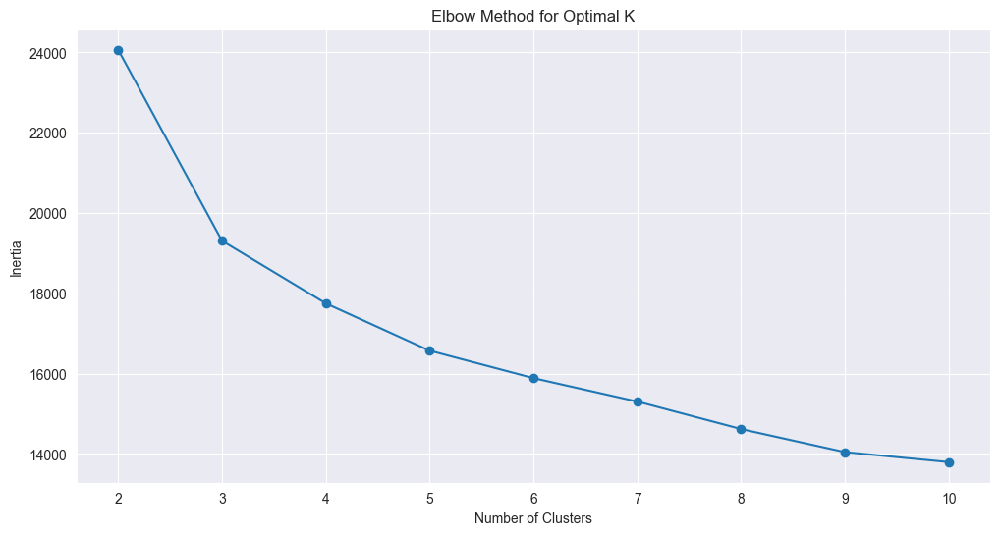

In [23]:
def compute_inertia_values(dataframe, cluster_range):
    inertias = []
    for k in cluster_range:
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(dataframe)
        inertias.append(kmeans.inertia_)
    return inertias

def plot_elbow_method(cluster_range, inertias):
    plt.figure(figsize=(12, 6))
    plt.plot(cluster_range, inertias, marker='o')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal K')
    plt.show()


df_cluster = df_normalized.copy()
df_cluster = df_cluster.drop(columns=['response'])
cluster_range = range(2, 11)
km_inertia = compute_inertia_values(df_cluster, cluster_range)   
plot_elbow_method(cluster_range, km_inertia)

Based on the elbow plot we built, the number of clusters that inverts the diminishing returns of the inertia is a toss up between 4 and 5. Despite the subtle difference, we ended up choosing the option that, looking at the density plots later on, seemed to better represent the different customer segments. 

Moreover, the silhouette score does support the choice of 5 over 4, as the generated array is higher for the former.

In [24]:
def kmeans_clustering(dataframe, n):
    
    kmeans_arr = []
    silhouette_arr = []
    for n in list(range(2, n+1)):
        kmeans = KMeans(n_clusters=n, random_state = 0)
        km_clusters = kmeans.fit_predict(dataframe)
        kmeans_arr.append(km_clusters)
        silhouette_arr.append(silhouette_score(dataframe, km_clusters))
    
    # Adding the k-means cluster labels to the dataframe
    dataframe['kmeans_cluster'] = kmeans_arr[-1]

    return dataframe, kmeans_arr, silhouette_arr

km_df, km_results, sil_scores = kmeans_clustering(df_cluster, 5)
print("Silhouette Scores", [float(num) for num in sil_scores], "\n")
km_df.head(10)

Silhouette Scores [0.3957353592908065, 0.2889809608755445, 0.23518503054501294, 0.18573243845451934] 



,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,age,months_as_customer,total_spend,total_purchases,total_accepted_cpm,is_parent,is_couple,education_basic,education_graduation,education_master,education_phd,kmeans_cluster
0,10.970592,0,0,0.585859,6.455199,4.488636,6.304449,5.153292,4.488636,4.488636,1.386294,2.197225,2.397895,0.307692,0.35,0,0,0,0,0,0,0.696429,0.916667,7.388946,0.581395,0,0,0,0,1,0,0,1
1,10.743869,1,1,0.383838,2.484907,0.693147,1.945910,1.098612,0.693147,1.945910,1.098612,0.693147,0.693147,0.153846,0.25,0,0,0,0,0,0,0.750000,0.166667,3.332205,0.139535,0,1,0,0,1,0,0,2
2,11.179046,0,0,0.262626,6.056784,3.912023,4.852030,4.718499,3.091042,3.761200,0.693147,2.197225,1.098612,0.769231,0.20,0,0,0,0,0,0,0.553571,0.458333,6.655440,0.488372,0,0,1,0,1,0,0,1
3,10.190432,1,0,0.262626,2.484907,1.609438,3.044522,2.397895,1.386294,1.791759,1.098612,1.098612,0.000000,0.307692,0.30,0,0,0,0,0,0,0.214286,0.208333,3.988984,0.186047,0,1,1,0,1,0,0,4
4,10.973254,1,0,0.949495,5.159055,3.784190,4.779123,3.850148,3.332205,2.772589,1.791759,1.791759,1.386294,0.461538,0.25,0,0,0,0,0,0,0.267857,0.250000,6.047372,0.441860,0,1,1,0,0,0,1,3
5,11.043146,0,1,0.161616,6.255750,3.761200,4.595120,0.000000,3.761200,2.708050,1.098612,1.945910,1.609438,0.769231,0.30,0,0,0,0,0,0,0.517857,0.416667,6.575076,0.511628,0,1,1,0,0,1,0,3
6,10.926586,0,1,0.343434,5.463832,4.189655,5.105945,3.931826,3.912023,3.332205,1.609438,2.079442,1.386294,0.538462,0.30,0,0,0,0,0,0,0.446429,0.833333,6.381816,0.488372,0,1,0,0,1,0,0,1
7,10.417957,1,0,0.323232,4.343805,2.397895,4.043051,1.386294,0.693147,3.178054,1.098612,1.609438,0.000000,0.307692,0.40,0,0,0,0,0,0,0.196429,0.583333,5.135798,0.232558,0,1,1,0,0,0,1,0
8,10.320618,1,0,0.191919,2.708050,0.000000,3.218876,1.386294,1.386294,1.098612,0.693147,1.386294,0.000000,0.153846,0.45,0,0,0,0,0,0,0.392857,0.541667,3.850148,0.139535,0,1,1,0,0,0,1,2
9,8.639234,1,1,0.686869,3.367296,0.000000,1.945910,0.693147,0.693147,2.639057,0.693147,0.693147,0.000000,0.000000,1.00,1,0,0,0,0,0,0.821429,0.166667,3.912023,0.046512,1,1,1,0,0,0,1,2


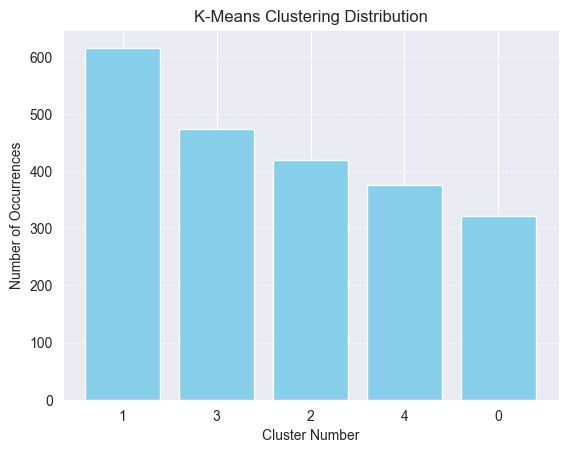

In [25]:
# Plotting K-Means clustering density plot
def plot_cluster_distribution(dataframe, column1, title1, xlab1):
    
    cluster_counts = dataframe[column1].value_counts()

    plt.bar(cluster_counts.index.astype(str), cluster_counts.values, color='skyblue')
    plt.title(title1)
    plt.xlabel(xlab1)
    plt.ylabel('Number of Occurrences')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()
    
plot_cluster_distribution(km_df, 'kmeans_cluster', 'K-Means Clustering Distribution', 'Cluster Number')

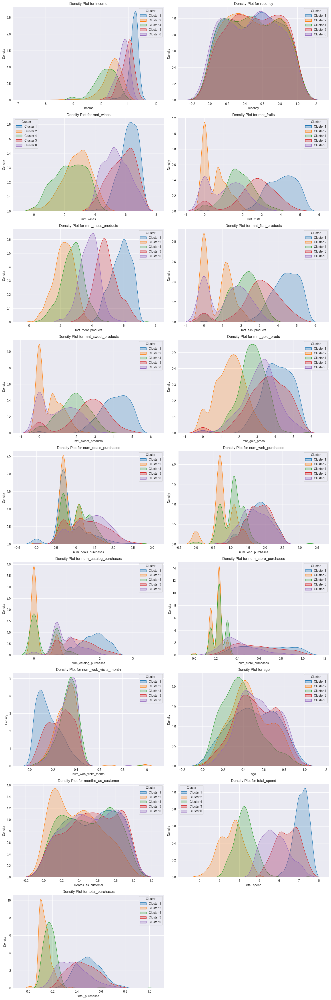

In [26]:
#Plot density plot for numerical features but with kmeans cluster color labels
def plot_kmeans_density_subplots(dataframe, cluster_column, numerical_features, num_cols=2):
    num_rows = -(-len(numerical_features) // num_cols)  # Ceiling division for rows
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
    
    for ax, col in zip(axes.flat, numerical_features):
        for cluster in dataframe[cluster_column].unique():
            sns.kdeplot(
                data=dataframe[dataframe[cluster_column] == cluster], 
                x=col, 
                label=f'Cluster {cluster}', 
                shade=True, 
                ax=ax
            )
        ax.set_title(f'Density Plot for {col}')
        ax.set_xlabel(col)
        ax.legend(title='Cluster')
    
    # Turn off unused subplots
    for ax in axes.flat[len(numerical_features):]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Call the function
plot_kmeans_density_subplots(km_df, 'kmeans_cluster', numerical_features)

The above density plots show how the clustering affects the different features individually. This can help us understand the characteristics of each cluster and how they differ from one another. 

Overall, the customer segmentation is noticeable, but some overlaps do occur as well. 

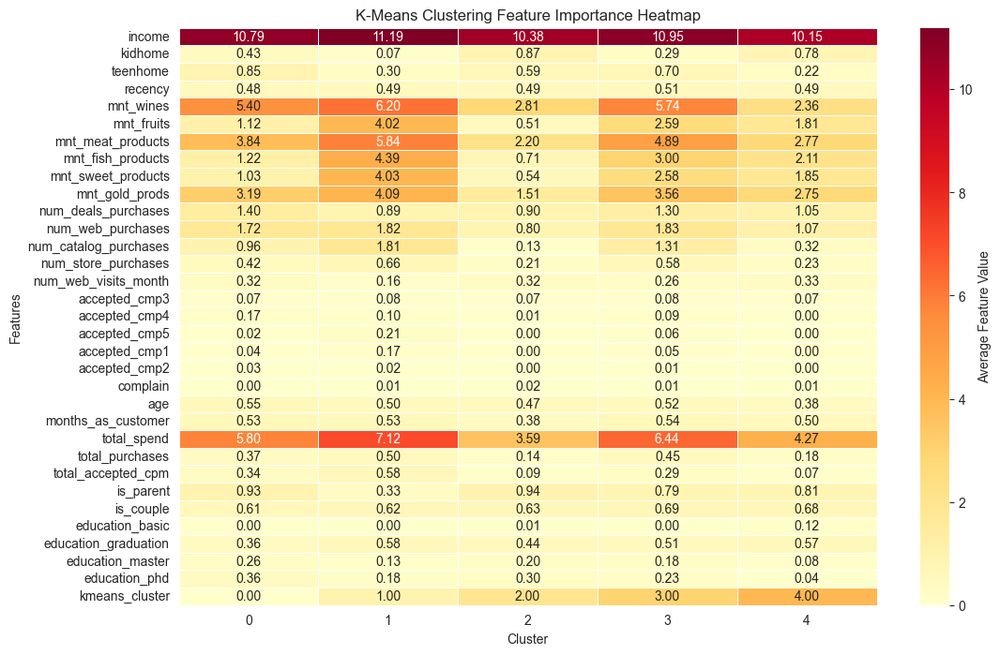

In [27]:
# Plotting a feature importance plot for the K-Means clustering
def plot_feature_importance(dataframe, labels, title):
    
    cluster_features = dataframe
    cluster_features['Cluster'] = labels
    cluster_means = cluster_features.groupby('Cluster').mean()

    plt.figure(figsize=(12, 8))
    sns.heatmap(cluster_means.T, cmap='YlOrRd', annot=True, fmt='.2f', 
                cbar_kws={'label': 'Average Feature Value'}, linewidths=0.5)
    plt.title(title)
    plt.xlabel('Cluster')
    plt.ylabel('Features')
    plt.xticks(rotation=0)
    plt.show()

plot_feature_importance(km_df, km_df['kmeans_cluster'], 'K-Means Clustering Feature Importance Heatmap')


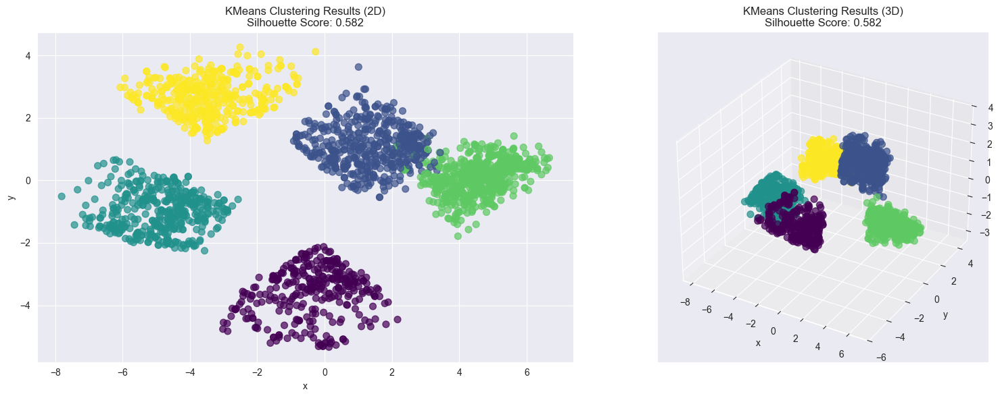

In [28]:
# Performing PCA for cluster visualization purposes
pca = PCA(n_components=3)
df_pca = pca.fit_transform(df_cluster)

def plot_kmeans(dataframe, optimal_k):
    
    fig = plt.figure(figsize=(24, 6))

    # Left plot: 2D Clustering Results
    kmeans = KMeans(n_clusters=optimal_k, random_state=0)
    kmeans.fit(dataframe)
    kmeans_results = kmeans.predict(dataframe)
    silhouette_score_value = silhouette_score(dataframe, kmeans_results)

    ax1 = fig.add_subplot(1, 3, 1)
    ax1.scatter(dataframe[:, 0], dataframe[:, 1], c=kmeans_results, cmap='viridis', s=50, alpha=0.7)
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.set_title(f'KMeans Clustering Results (2D)\nSilhouette Score: {silhouette_score_value:.3f}')

    # Right plot: 3D Clustering Results
    ax2 = fig.add_subplot(1, 3, 2, projection='3d')
    ax2.scatter(dataframe[:, 0], dataframe[:, 1], dataframe[:, 2], c=kmeans_results, cmap='viridis', s=50, alpha=0.7)
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    ax2.set_zlabel('z')
    ax2.set_title(f'KMeans Clustering Results (3D)\nSilhouette Score: {silhouette_score_value:.3f}')

    plt.tight_layout()
    plt.show()

# After looking at the elbow method, we pass the optimal number of clusters as a parameter
plot_kmeans(df_pca, 5)

### Hierarchical Clustering

Since the clustering is being used as part of EDA, we will not compare it with true labels, but rather focus on the clustering itself. This allows us to discover natural patterns.

Average linkage is a compromise between single and complete linkage. Due to the fact that we are not removing a significant amount of outliers, this options makes sense to balance sensitivity to them, as well as chaining. As such, we considered it an appropriate method to opt for in the upcoming hierarchical clustering.

To begin, finding the optimal threshold requires identifying the largest gap between consecutive distances in the dendrogram.


In [29]:
def find_optimal_threshold(Z):

    # Calculating the distances between clusters, and then finding the largest gap between consecutive distances
    distances = Z[:, 2]
    gaps = np.diff(distances)
    largest_gap = distances[np.argmax(gaps)]
    
    return largest_gap

In [30]:
def perform_clustering(data, method):
    
    Z = linkage(data, method=method)
    dist_threshold = find_optimal_threshold(Z)    
    clusters = cut_tree(Z, height=dist_threshold).flatten()
    
    return Z, clusters, dist_threshold

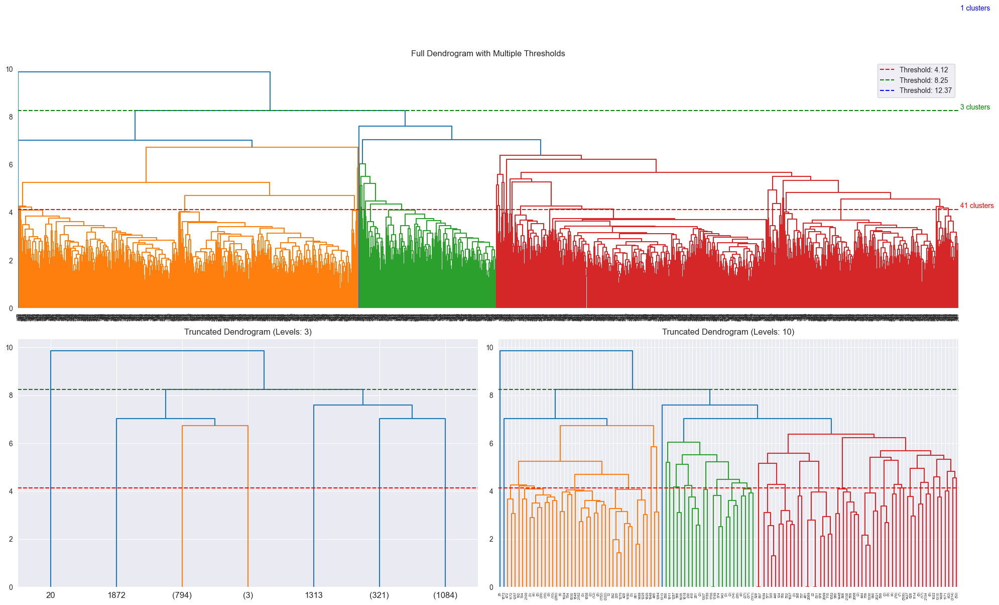

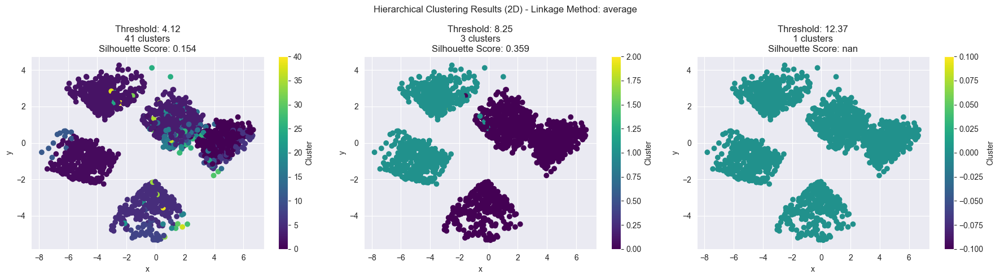

In [31]:
def plot_cluster_analysis(Z, thresholds):

    fig = plt.figure(figsize=(20, 12))
    
    # Plotting the full dendrogram with multiple thresholds
    ax1 = plt.subplot2grid((2, 2), (0, 0), colspan=2)
    dendrogram(Z, leaf_rotation=90)
    
    colours = ['r', 'g', 'b']
    for threshold, color in zip(thresholds, colours):
        ax1.axhline(y=threshold, color=color, linestyle='--', 
                   label=f'Threshold: {threshold:.2f}')
        
        clusters = cut_tree(Z, height=threshold).flatten()
        n_clusters = len(np.unique(clusters))
        ax1.text(ax1.get_xlim()[1], threshold, f' {n_clusters} clusters', 
                va='bottom', ha='left', color=color)
    
    ax1.set_title('Full Dendrogram with Multiple Thresholds')
    ax1.legend()
    
    # Plotting the truncated dendrograms at different levels 
    # This is to showcase how levels purely represent a viewing perspective
    for i, level in enumerate([3, 10]):
        ax = plt.subplot2grid((2, 2), (1, i))
        dendrogram(Z, truncate_mode='level', p=level)
        
        # Plotting the thresholds
        for threshold, color in zip(thresholds, colours):
            ax.axhline(y=threshold, color=color, linestyle='--')
        
        ax.set_title(f'Truncated Dendrogram (Levels: {level})')
    
    plt.tight_layout()
    plt.show()

# These plots are meant to show how different thresholds influence the number of clusters and what impact they have on the silhouette scores
def plot_threshold_effects(data, Z, thresholds, sil_scores, method):
    
    n_thresholds = len(thresholds)
    fig, axs = plt.subplots(1, n_thresholds, figsize=(6*n_thresholds, 5))
    
    for i, threshold in enumerate(thresholds):
        clusters = cut_tree(Z, height=threshold).flatten()
        n_clusters = len(np.unique(clusters))
        
        scatter = axs[i].scatter(data[:, 0], data[:, 1], c=clusters, cmap='viridis')
        axs[i].set_title(f'Threshold: {threshold:.2f}\n{n_clusters} clusters\nSilhouette Score: {sil_scores[i]:.3f}')
        axs[i].set_xlabel('x')
        axs[i].set_ylabel('y')
        plt.colorbar(scatter, ax=axs[i], label='Cluster')
    
    plt.suptitle(f'Hierarchical Clustering Results (2D) - Linkage Method: {method}')
    plt.tight_layout()
    plt.show()

def main_clustering_analysis(data, method='average'):

    Z, clusters, optimal_threshold = perform_clustering(data, method)
    
    # Comparison thresholds based on the optimal threshold
    thresholds = [optimal_threshold * 0.5, optimal_threshold, optimal_threshold * 1.5]
    
    sil_scores = []
    for threshold in thresholds:
        clusters = cut_tree(Z, height=threshold).flatten()
        n_clusters = len(np.unique(clusters))
        
        # It only makes sense to calculate the silhouette score IF there are multiple clusters
        if n_clusters > 1:
            sil_score = np.round(silhouette_score(data, clusters), 3)
            sil_scores.append(sil_score)
        else:
            sil_scores.append(np.nan)
    
    # Plotting visualizations (solely making use of PCA for 2D representation)
    pca = PCA(n_components=3)
    df_pca = pca.fit_transform(data)
    plot_cluster_analysis(Z, thresholds)
    plot_threshold_effects(df_pca, Z, thresholds, sil_scores, method)
    # Uncomment below to check how the cluster visualization would look without applying PCA
    #plot_threshold_effects(df_cluster.to_numpy(), Z, thresholds, sil_scores, method)
    
    return Z, thresholds

linkage_method = 'average'
Z, thresholds = main_clustering_analysis(df_cluster, linkage_method)

As is possible to see, the optimal threshold of 8.25 results in a silhouette score of 0.359. This is still not able to outperform the clustering conducted by the K-Means algorithm (0.528), making us consider it a better fit for customer segmentation purposes.

It is important to remember, however, that the silhouette score is not the only metric we should consider when evaluating clustering results. The number of clusters and the actual visual representation of the clusters are also important factors to consider. Only by considering all of them together can we make an informed decision on which clustering method ends up telling a more coherent story.

# Assocation rules

With association rules, frequent itemsets are found in the data. A frequent itemset, is a set of variables that has a high likelihood of being found together. An itemset is at least a two variables, but it can be much more. The likelihood of an itemset being found, is determined through the support support thresholds. There are two types of requirements or steps in assocation rules:
1. num_itemsets. How frequent a combination of an itemset to appear in the dataset, to be considered an itemset. This is important, because there might be an obsure itemset, with only a single instance that resulted in a purchase, so even though the likihood of purchase when seeing this itemset is 100%, the actual real world application is 0
2. confidence of support threshold. This is the required confidence that an itemset must have to result in purchasing. So if variable A + B -> C. The support threshold determines how often the A + B, indeed was seen with a result in C. In other terms, if someone buys coffee(A) and sugar(B), in at least 80% of the cases he aslo buys coffee milk. the confidence in this scenario is threshold is set to 0.8. The assocation rule algorithm, only identifies the association rule, when the cofidence of the rule has at least the likelihood to occur in the data.

Steps in the association rule Appropri dataset
1. Convert all variables that we would like to test for into a binary representation

In [32]:
df_normalized

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,response,age,months_as_customer,total_spend,total_purchases,total_accepted_cpm,is_parent,is_couple,education_basic,education_graduation,education_master,education_phd
0,10.970592,0,0,0.585859,6.455199,4.488636,6.304449,5.153292,4.488636,4.488636,1.386294,2.197225,2.397895,0.307692,0.35,0,0,0,0,0,0,1,0.696429,0.916667,7.388946,0.581395,0,0,0,0,1,0,0
1,10.743869,1,1,0.383838,2.484907,0.693147,1.945910,1.098612,0.693147,1.945910,1.098612,0.693147,0.693147,0.153846,0.25,0,0,0,0,0,0,0,0.750000,0.166667,3.332205,0.139535,0,1,0,0,1,0,0
2,11.179046,0,0,0.262626,6.056784,3.912023,4.852030,4.718499,3.091042,3.761200,0.693147,2.197225,1.098612,0.769231,0.20,0,0,0,0,0,0,0,0.553571,0.458333,6.655440,0.488372,0,0,1,0,1,0,0
3,10.190432,1,0,0.262626,2.484907,1.609438,3.044522,2.397895,1.386294,1.791759,1.098612,1.098612,0.000000,0.307692,0.30,0,0,0,0,0,0,0,0.214286,0.208333,3.988984,0.186047,0,1,1,0,1,0,0
4,10.973254,1,0,0.949495,5.159055,3.784190,4.779123,3.850148,3.332205,2.772589,1.791759,1.791759,1.386294,0.461538,0.25,0,0,0,0,0,0,0,0.267857,0.250000,6.047372,0.441860,0,1,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,11.022295,0,1,0.464646,6.565265,3.784190,5.209486,3.761200,4.779123,5.513429,1.098612,2.302585,1.386294,0.307692,0.25,0,0,0,0,0,0,0,0.517857,0.541667,7.201916,0.418605,0,1,1,0,1,0,0
2236,11.066873,2,1,0.565657,6.008813,0.000000,3.433987,0.000000,0.000000,2.197225,2.079442,2.197225,1.098612,0.384615,0.35,0,0,0,1,0,0,0,0.892857,0.041667,6.098074,0.511628,1,1,1,0,0,0,1
2237,10.950491,0,0,0.919192,6.812345,3.891820,5.384495,3.496508,2.564949,3.218876,0.693147,1.098612,1.386294,1.000000,0.30,0,1,0,0,0,0,0,0.267857,0.208333,7.124478,0.441860,1,0,0,0,1,0,0
2238,11.145421,0,1,0.080808,6.061457,3.433987,5.370638,4.394449,3.433987,4.127134,1.098612,1.945910,1.791759,0.769231,0.15,0,0,0,0,0,0,0,0.714286,0.208333,6.738152,0.534884,0,1,1,0,0,1,0


In [33]:
def transform_df_into_interquartile_range_categories(df_to_transform):
    """
    it is assumed that the values in the df are already scaled, relating to its distribution.

    For each float column in columns_to_transform. They should become a dummy variable of the same column depending on where the cell is in the interquartile range of such a column

    For each float column in columns_to_transform, four new binary columns will be created
    indicating which quartile range the value falls into:
    - '{col}_very_low': 1 if < Q1, else 0
    - '{col}_low': 1 if >= Q1 and < Q2, else 0
    - '{col}_high': 1 if >= Q2 and < Q3, else 0
    - '{col}_very_high': 1 if >= Q3, else 0

    :param df_to_transform: pandas DataFrame containing the columns to transform
    :return: transformed pandas DataFrame with new binary columns
    """
    df_local = df_to_transform#.copy()

    columns_to_transform = ['income', 'recency', 'mnt_wines', 'mnt_fruits', 'mnt_meat_products', 'mnt_fish_products',
                               'mnt_sweet_products', 'mnt_gold_prods', 'num_deals_purchases', 'num_web_purchases',
                               'num_catalog_purchases', 'num_store_purchases', 'num_web_visits_month', 'age',
                               'months_as_customer', 'total_spend', 'total_purchases']

    # For each column, calculate quartiles and create new binary columns
    for col in columns_to_transform:
        if col in df_local.columns:
            # Calculate quartiles
            q1 = df_local[col].quantile(0.25)
            q2 = df_local[col].quantile(0.50)  # median
            q3 = df_local[col].quantile(0.75)

            # Create four new binary columns for each quartile range
            df_local[f'{col}_very_low'] = (df_local[col] < q1).astype(int)
            df_local[f'{col}_low'] = ((df_local[col] >= q1) & (df_local[col] < q2)).astype(int)
            df_local[f'{col}_high'] = ((df_local[col] >= q2) & (df_local[col] < q3)).astype(int)
            df_local[f'{col}_very_high'] = (df_local[col] >= q3).astype(int)

            # Drop original numerical column
            df_local.drop(columns=[col], inplace=True)

    # create new dummy column, if multiple kids are at home using a onehot encoded variable
    df_local["multiplekidhome"] = df_local["kidhome"].apply(lambda x: 1 if x > 1 else 0)
    df_local["multipleteenhome"] = df_local["teenhome"].apply(lambda x: 1 if x > 1 else 0)

    # transforming kidhome and teenhome to be a binary column
    df_local["kidhome"] = df_local["kidhome"].apply(lambda x: 1 if x > 0 else 0)
    df_local["teenhome"] = df_local["teenhome"].apply(lambda x: 1 if x > 0 else 0)
    df_local = df_local.applymap(lambda x: 1 if x > 0 else 0)

    return df_local

df_normalized_copy = df_normalized.copy()
df_interquartile_transformed = transform_df_into_interquartile_range_categories(df_normalized_copy)
df_interquartile_transformed

,kidhome,teenhome,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,response,total_accepted_cpm,is_parent,is_couple,education_basic,education_graduation,education_master,education_phd,income_very_low,income_low,income_high,income_very_high,recency_very_low,recency_low,recency_high,recency_very_high,mnt_wines_very_low,mnt_wines_low,mnt_wines_high,mnt_wines_very_high,mnt_fruits_very_low,mnt_fruits_low,mnt_fruits_high,mnt_fruits_very_high,mnt_meat_products_very_low,mnt_meat_products_low,mnt_meat_products_high,mnt_meat_products_very_high,mnt_fish_products_very_low,mnt_fish_products_low,mnt_fish_products_high,mnt_fish_products_very_high,mnt_sweet_products_very_low,mnt_sweet_products_low,mnt_sweet_products_high,mnt_sweet_products_very_high,mnt_gold_prods_very_low,mnt_gold_prods_low,mnt_gold_prods_high,mnt_gold_prods_very_high,num_deals_purchases_very_low,num_deals_purchases_low,num_deals_purchases_high,num_deals_purchases_very_high,num_web_purchases_very_low,num_web_purchases_low,num_web_purchases_high,num_web_purchases_very_high,num_catalog_purchases_very_low,num_catalog_purchases_low,num_catalog_purchases_high,num_catalog_purchases_very_high,num_store_purchases_very_low,num_store_purchases_low,num_store_purchases_high,num_store_purchases_very_high,num_web_visits_month_very_low,num_web_visits_month_low,num_web_visits_month_high,num_web_visits_month_very_high,age_very_low,age_low,age_high,age_very_high,months_as_customer_very_low,months_as_customer_low,months_as_customer_high,months_as_customer_very_high,total_spend_very_low,total_spend_low,total_spend_high,total_spend_very_high,total_purchases_very_low,total_purchases_low,total_purchases_high,total_purchases_very_high,multiplekidhome,multipleteenhome
0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0
1,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0
3,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0
2236,1,1,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,1,0
2237,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0
2238,0,1,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0


We set the threshold for itemsets to be occuring in at least 5% of the cases, in order for an itemset to be viewed as valid

In [34]:
#running the fpgrowth algorithm
def get_itemsets_from_interquartilerange_df(df_interquartile_itemset, min_support=0.05, print_items=True):
    dataset = df_interquartile_itemset
    item_sets_found = fpgrowth(dataset, min_support=min_support, use_colnames=True, max_len=6, verbose=False)
    if print_items:
        for index, item in item_sets_found.iterrows():
            for val in item["itemsets"]:
                if "response" in val:
                    print("itemset nr = ", index)
                    print("itemset = ",item["itemsets"])
                    print("support itemset = ", item["support"])
                    print()
    return item_sets_found
item_sets = get_itemsets_from_interquartilerange_df(df_interquartile_transformed, 0.05)

itemset nr =  18
itemset =  frozenset({'response'})
support itemset =  0.1510204081632653

itemset nr =  3362
itemset =  frozenset({'num_catalog_purchases_very_high', 'response'})
support itemset =  0.07936507936507936

itemset nr =  3363
itemset =  frozenset({'response', 'total_spend_very_high'})
support itemset =  0.07573696145124717

itemset nr =  3364
itemset =  frozenset({'mnt_meat_products_very_high', 'response'})
support itemset =  0.06938775510204082

itemset nr =  3365
itemset =  frozenset({'months_as_customer_very_high', 'response'})
support itemset =  0.06893424036281179

itemset nr =  3366
itemset =  frozenset({'response', 'education_graduation'})
support itemset =  0.06893424036281179

itemset nr =  3367
itemset =  frozenset({'mnt_wines_very_high', 'response'})
support itemset =  0.06757369614512472

itemset nr =  3368
itemset =  frozenset({'response', 'num_web_visits_month_very_high'})
support itemset =  0.05986394557823129

itemset nr =  3369
itemset =  frozenset({'num_w

We are most interested in conversion of a customer into a response. therefore we want to find the association rules with the variables and response

The support metric, mean how frequently in the data the pattern is found.
- antecedent support: refers to how often the independent variable(s) occur together in the data
- consequents support: refers to how often the dependent variable occurs in the data
- confidence: refers to how likely the antecedent is found to be true when the antecedents are found together
- lift: the higher the lift is, the more likely a association is to be found relative to the antecedent and consequent to be occuring based on statistical likelihood

### Lift threshold
we only take the rules where the lift of the rule is at least 1.15. This ensures that only association rules are taken into account that are more likely to uccur compared to the rule occuring based on statistical probability, thus only association rules.

In [35]:
def get_rules_from_itemsets(item_sets_found, metric="lift", min_threshold=1.15):
    # # Generate association rules with a minimum confidence level
    rules_found = association_rules(item_sets_found, metric=metric,
                                    min_threshold=min_threshold, num_itemsets=len(item_sets_found))
    return rules_found

rules = get_rules_from_itemsets(item_sets)

In [36]:
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(is_parent),(num_web_visits_month_very_high),0.715193,0.372336,0.330159,0.461636,1.239839,1.0,0.063867,1.165874,0.679208,0.435928,0.142274,0.674180
1,(num_web_visits_month_very_high),(is_parent),0.372336,0.715193,0.330159,0.886724,1.239839,1.0,0.063867,2.514266,0.308196,0.435928,0.602270,0.674180
2,(num_catalog_purchases_low),(num_web_visits_month_very_high),0.481179,0.372336,0.270295,0.561734,1.508677,1.0,0.091135,1.432155,0.649873,0.463453,0.301751,0.643839
3,(num_web_visits_month_very_high),(num_catalog_purchases_low),0.372336,0.481179,0.270295,0.725944,1.508677,1.0,0.091135,1.893120,0.537178,0.463453,0.471771,0.643839
4,(num_web_visits_month_very_high),(kidhome),0.372336,0.421315,0.251247,0.674787,1.601620,1.0,0.094377,1.779402,0.598460,0.463211,0.438013,0.635563
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
567009,"(mnt_wines_very_high, total_accepted_cpm)",(accepted_cmp4),0.121542,0.074376,0.052608,0.432836,5.819530,1.0,0.043568,1.632021,0.942748,0.367089,0.387263,0.570076
567010,"(accepted_cmp4, total_accepted_cpm)",(mnt_wines_very_high),0.074376,0.250340,0.052608,0.707317,2.825424,1.0,0.033988,2.561338,0.697984,0.193333,0.609579,0.458731
567011,(mnt_wines_very_high),"(accepted_cmp4, total_accepted_cpm)",0.250340,0.074376,0.052608,0.210145,2.825424,1.0,0.033988,1.171890,0.861819,0.193333,0.146678,0.458731
567012,(accepted_cmp4),"(mnt_wines_very_high, total_accepted_cpm)",0.074376,0.121542,0.052608,0.707317,5.819530,1.0,0.043568,3.001398,0.894710,0.367089,0.666822,0.570076


As can be seen from the itemsets and association rules. There are interesting patterns in the data, that can be used for a machine learning to be trained upon. The main point of interest is to predict if a marketing action will result in a purchase. Therefore, it is most intersting to find rules that relate to the target variable "response".

Therefore, below we will filter the association rules that have at least a confidence of 50% and have the consequents equal to response

In [37]:
def filter_association_rules_response(df_rules):
    # Create an empty DataFrame with the same columns as df_rules
    filtered_rules = pd.DataFrame(columns=df_rules.columns)

    # List to collect rows that meet the condition
    matching_rows = []

    for index, item in df_rules.iterrows():
        for val in item["consequents"]:
            if "response" in val:
                # only take consequents that are only response and not longer combinataions
                if len(item["consequents"]) == 1:
                    #indexes_with_antecedent.append(index)
                    # add item to pandas dataframe
                    matching_rows.append(item)

    # Convert the list of matching rows to a DataFrame and sort by confidence
     # If matching_rows has any entries, convert it to a DataFrame
    if matching_rows:
        filtered_rules = pd.DataFrame(matching_rows)

    # Sort by confidence (if there are rows)
    if not filtered_rules.empty:
        filtered_rules = filtered_rules.sort_values(by="confidence", ascending=False)

    return filtered_rules


rules_response_var_df = filter_association_rules_response(rules)
rules_response_var_df

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
43867,"(income_very_high, total_accepted_cpm)",(response),0.107029,0.15102,0.051247,0.478814,3.170522,1.0,0.035084,1.628936,0.766649,0.247807,0.386103,0.409076
43720,"(total_spend_very_high, total_accepted_cpm)",(response),0.112472,0.15102,0.053515,0.475806,3.150610,1.0,0.036529,1.619592,0.769104,0.254860,0.382560,0.415080
43707,"(num_catalog_purchases_very_high, total_accept...",(response),0.122449,0.15102,0.054875,0.448148,2.967467,1.0,0.036383,1.538419,0.755526,0.251037,0.349982,0.405756
43775,"(mnt_wines_very_high, total_accepted_cpm)",(response),0.121542,0.15102,0.051701,0.425373,2.816660,1.0,0.033345,1.477445,0.734206,0.234086,0.323156,0.383858
43697,(total_accepted_cpm),(response),0.207710,0.15102,0.084807,0.408297,2.703588,1.0,0.053439,1.434807,0.795316,0.309603,0.303042,0.484929
43816,"(mnt_wines_very_high, income_very_high, total_...",(response),0.141043,0.15102,0.051247,0.363344,2.405927,1.0,0.029947,1.333498,0.680313,0.212806,0.250093,0.351342
43801,"(mnt_wines_very_high, mnt_meat_products_very_h...",(response),0.141950,0.15102,0.050794,0.357827,2.369398,1.0,0.029356,1.322043,0.673564,0.209738,0.243595,0.347082
43768,"(mnt_wines_very_high, mnt_meat_products_very_h...",(response),0.146939,0.15102,0.051247,0.348765,2.309393,1.0,0.029056,1.303646,0.664648,0.207721,0.232921,0.344052
43787,"(num_catalog_purchases_very_high, mnt_wines_ve...",(response),0.156916,0.15102,0.053968,0.343931,2.277379,1.0,0.030271,1.294039,0.665294,0.212500,0.227226,0.350644
43833,"(num_deals_purchases_low, total_spend_very_high)",(response),0.157823,0.15102,0.053968,0.341954,2.264290,1.0,0.030134,1.290152,0.662997,0.211744,0.224898,0.349656


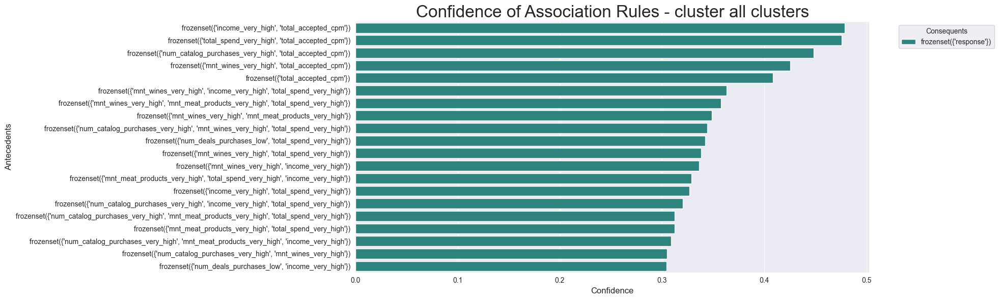

In [38]:
def plot_rules(rules_df_to_plot, cluster_group=1):
    # # Create a bar plot for confidence values

    plt.figure(figsize=(20, 6))
    sns.barplot(x='confidence', y='antecedents', hue='consequents', data=rules_df_to_plot.head(20), palette='viridis')

    # # Add title and labels
    plt.title(f'Confidence of Association Rules - cluster {cluster_group}', fontsize=24)
    plt.xlabel('Confidence', fontsize=12)
    plt.ylabel('Antecedents', fontsize=12)
    plt.legend(title='Consequents', bbox_to_anchor=(1.05, 1), loc='upper left')

    # # Show plot
    plt.tight_layout()
    plt.show()
plot_rules(rules_response_var_df, cluster_group="all clusters")

Add label with confidence of a row in the data to occur for the confidence found for such instances

We do this in increasing order because we want to overwrite possible previous combination of association rules being inserted.

We add the confidence of a row resulting in a response as an extra column

In [39]:
def add_confidence_column(df_input ,rules_df):
    df_marketing = df_input.copy()
    df_marketing["confidence"] = 0
    rules_df = rules_df.sort_values(by="confidence", ascending=True)
    for index, rule in rules_df.iterrows():

        frozen_set = [val for val in rule["antecedents"]]
        #df_interquartile_transformed[(df_interquartile_transformed['income_very_high'] ==1) & (df_interquartile_transformed['total_accepted_cpm'] == 1)]
        # Construct a condition to filter df_marketing based on all values in frozen_set
        filter_condition = True
        for condition in frozen_set:
            # Dynamically create conditions for each antecedent in the frozen set
            filter_condition &= (df_marketing[condition] == 1)

        # Apply the filter and set confidence based on the rule's confidence value
        df_marketing.loc[filter_condition, 'confidence'] = rule['confidence']
    return df_marketing.fillna(0)#.sort_index()

df_marketing_featured = add_confidence_column(df_interquartile_transformed, rules_response_var_df)
df_marketing_featured

,kidhome,teenhome,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,response,total_accepted_cpm,is_parent,is_couple,education_basic,education_graduation,education_master,education_phd,income_very_low,income_low,income_high,income_very_high,recency_very_low,recency_low,recency_high,recency_very_high,mnt_wines_very_low,mnt_wines_low,mnt_wines_high,mnt_wines_very_high,mnt_fruits_very_low,mnt_fruits_low,mnt_fruits_high,mnt_fruits_very_high,mnt_meat_products_very_low,mnt_meat_products_low,mnt_meat_products_high,mnt_meat_products_very_high,mnt_fish_products_very_low,mnt_fish_products_low,mnt_fish_products_high,mnt_fish_products_very_high,mnt_sweet_products_very_low,mnt_sweet_products_low,mnt_sweet_products_high,mnt_sweet_products_very_high,mnt_gold_prods_very_low,mnt_gold_prods_low,mnt_gold_prods_high,mnt_gold_prods_very_high,num_deals_purchases_very_low,num_deals_purchases_low,num_deals_purchases_high,num_deals_purchases_very_high,num_web_purchases_very_low,num_web_purchases_low,num_web_purchases_high,num_web_purchases_very_high,num_catalog_purchases_very_low,num_catalog_purchases_low,num_catalog_purchases_high,num_catalog_purchases_very_high,num_store_purchases_very_low,num_store_purchases_low,num_store_purchases_high,num_store_purchases_very_high,num_web_visits_month_very_low,num_web_visits_month_low,num_web_visits_month_high,num_web_visits_month_very_high,age_very_low,age_low,age_high,age_very_high,months_as_customer_very_low,months_as_customer_low,months_as_customer_high,months_as_customer_very_high,total_spend_very_low,total_spend_low,total_spend_high,total_spend_very_high,total_purchases_very_low,total_purchases_low,total_purchases_high,total_purchases_very_high,multiplekidhome,multipleteenhome,confidence
0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0.357827
1,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0.000000
2,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0.304569
3,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0.000000
4,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0.216846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0.338129
2236,1,1,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0.408297
2237,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0.475806
2238,0,1,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0.295195


In [40]:
df_marketing_featured

,kidhome,teenhome,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,response,total_accepted_cpm,is_parent,is_couple,education_basic,education_graduation,education_master,education_phd,income_very_low,income_low,income_high,income_very_high,recency_very_low,recency_low,recency_high,recency_very_high,mnt_wines_very_low,mnt_wines_low,mnt_wines_high,mnt_wines_very_high,mnt_fruits_very_low,mnt_fruits_low,mnt_fruits_high,mnt_fruits_very_high,mnt_meat_products_very_low,mnt_meat_products_low,mnt_meat_products_high,mnt_meat_products_very_high,mnt_fish_products_very_low,mnt_fish_products_low,mnt_fish_products_high,mnt_fish_products_very_high,mnt_sweet_products_very_low,mnt_sweet_products_low,mnt_sweet_products_high,mnt_sweet_products_very_high,mnt_gold_prods_very_low,mnt_gold_prods_low,mnt_gold_prods_high,mnt_gold_prods_very_high,num_deals_purchases_very_low,num_deals_purchases_low,num_deals_purchases_high,num_deals_purchases_very_high,num_web_purchases_very_low,num_web_purchases_low,num_web_purchases_high,num_web_purchases_very_high,num_catalog_purchases_very_low,num_catalog_purchases_low,num_catalog_purchases_high,num_catalog_purchases_very_high,num_store_purchases_very_low,num_store_purchases_low,num_store_purchases_high,num_store_purchases_very_high,num_web_visits_month_very_low,num_web_visits_month_low,num_web_visits_month_high,num_web_visits_month_very_high,age_very_low,age_low,age_high,age_very_high,months_as_customer_very_low,months_as_customer_low,months_as_customer_high,months_as_customer_very_high,total_spend_very_low,total_spend_low,total_spend_high,total_spend_very_high,total_purchases_very_low,total_purchases_low,total_purchases_high,total_purchases_very_high,multiplekidhome,multipleteenhome,confidence
0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0.357827
1,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0.000000
2,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0.304569
3,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0.000000
4,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0.216846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0.338129
2236,1,1,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0.408297
2237,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0.475806
2238,0,1,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0.295195


Previously, with association rules, we identified patterns in the data. Now, we aim to use the confidence from these rules as a variable in a predictive model to determine the likelihood of a row leading to a response. Initially, we examined patterns across the entire dataset. However, if we intend to create a variable for both the train and test sets, we need to compute patterns only on the training set. Otherwise, we risk overfitting by including information from the response variable.

Therefore, we must detect patterns in the training set to create the confidence variable, and then apply this variable to the test set without recalculating it. This approach ensures that the model remains unbiased and avoids overfitting.

For the association rules, we want to find rules for each cluster separately. We start by labeling each cluster in the data frame, then run the association rules pipeline individually for each cluster. This approach allows us to discover rules that are specific to each cluster, helping to speed up the process and make the findings more targeted.

Initially, we apply this to the entire dataset as part of the exploratory data analysis (EDA) to understand key patterns. Afterward, we set up a separate pipeline where we train the association rules only on the training set and then apply this transformation to the test set. Thus, we train and transform the training set and apply the trained association rules to the test set without considering any patterns specific to the test data, ensuring an unbiased approach.

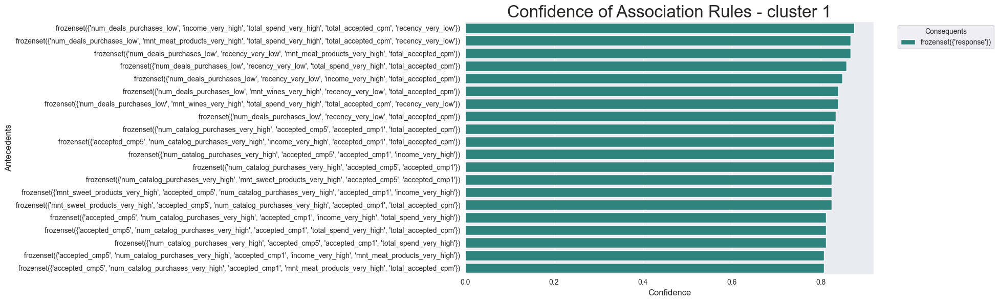

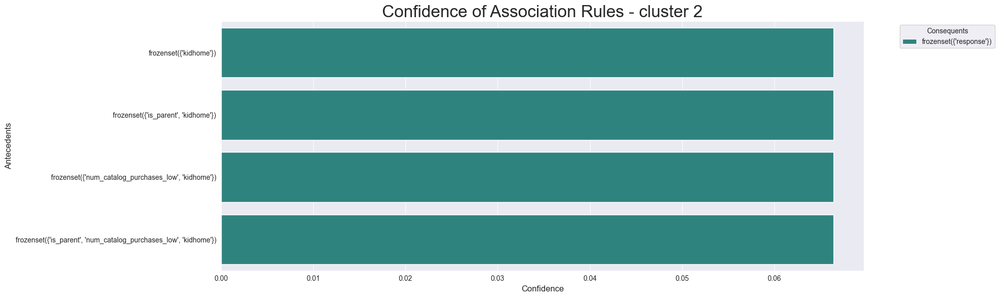

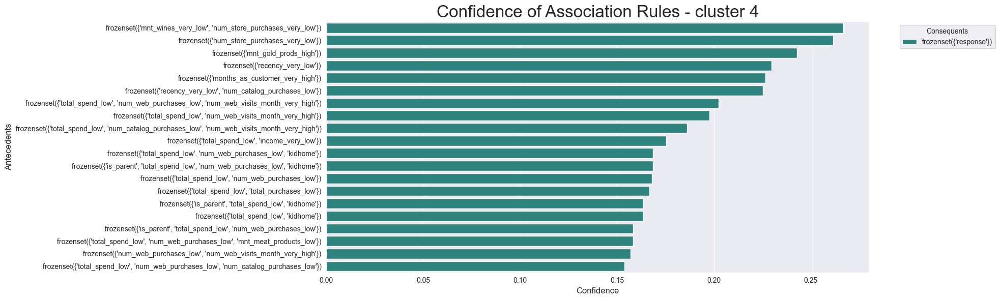

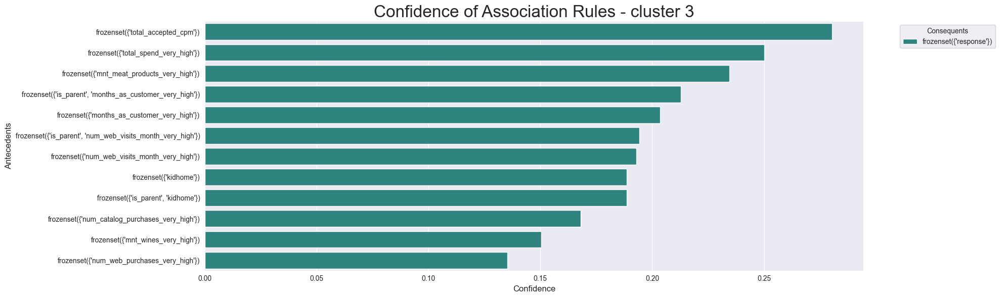

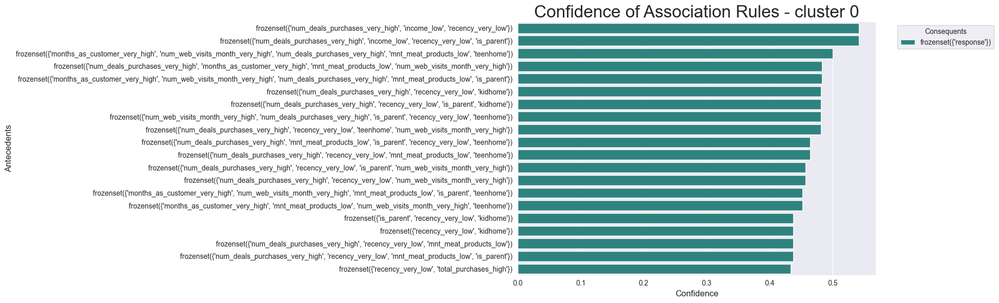

In [41]:
def split_test_train_fit_transform_df_association_rule_confidence_clustered(df_norm_to_split_input, df_cluster_variable):
    """
    This function performs the addition of the confidence rules to each of the dataframes
    :param df_norm_to_split_input:
    :param df_norm_to_split:
    :param df_cluster_variable:
    :return:
    """
    df_norm_to_split = df_norm_to_split_input.copy()

    df_norm_to_split["confidence"] = 0
    norm_y = df_norm_to_split['response']

    df_norm_to_split_train, df_norm_to_split_test, norm_y_train, norm_y_test = train_test_split(df_norm_to_split, norm_y, test_size=0.2, random_state=0)
    df_norm_to_split_train = df_norm_to_split_train.reset_index(drop=True)
    df_norm_to_split_test= df_norm_to_split_test.reset_index(drop=True)
    norm_y_train= norm_y_train.reset_index(drop=True)
    norm_y_test= norm_y_test.reset_index(drop=True)
    df_interquartile = transform_df_into_interquartile_range_categories(df_norm_to_split)
    # add clustering variable
    df_interquartile = df_interquartile.join(df_cluster_variable[['kmeans_cluster']], how='left')

    df_interquartile_train, df_interquartile_test, y_train, y_test = train_test_split(df_interquartile, norm_y, test_size=0.2, random_state=0)
    # Reset and sort indexes for train and test sets to avoid alignment issues
    df_interquartile_train = df_interquartile_train.reset_index(drop=True)
    df_interquartile_test = df_interquartile_test.reset_index(drop=True)
    y_train = y_train.reset_index(drop=True)
    y_test = y_test.reset_index(drop=True)

    for k_cluster in df_interquartile["kmeans_cluster"].unique():
        df_clustered_for_itemsets = df_interquartile_train[df_interquartile_train["kmeans_cluster"]== k_cluster]
        # we would like to drop the kmeans_cluster. we are only evaluating this cluster in this iteration, so all values will be equal to kmeans_cluster
        item_sets_train = get_itemsets_from_interquartilerange_df(df_clustered_for_itemsets.drop(["kmeans_cluster"], axis=1), min_support=0.05, print_items=False)

        rules_train = get_rules_from_itemsets(item_sets_train)
        rules_response_train = filter_association_rules_response(rules_train).sort_values(by="lift")

        plot_rules(rules_response_train.sort_values(ascending=False, by='confidence'), cluster_group=k_cluster)

        # add the rules to the train df
        df_interquartile_train.loc[
            df_clustered_for_itemsets.index,
            'confidence'] = add_confidence_column(df_clustered_for_itemsets, rules_response_train)

        # add the rules for this cluster to the test df
        df_clustered_for_itemsets_test_set = df_interquartile_test[df_interquartile_test["kmeans_cluster"]==k_cluster]

        # add the confidence to the dataset
        df_interquartile_test.loc[
            df_clustered_for_itemsets_test_set.index, 'confidence'
        ] =  add_confidence_column(df_clustered_for_itemsets_test_set, rules_response_train)

    # Add the confidence to the normalized dataframe
    df_norm_to_split_train["confidence"] = df_interquartile_train["confidence"]
    df_norm_to_split_test["confidence"] = df_interquartile_test["confidence"]
    return df_norm_to_split_train.drop(["response"],axis=1), df_norm_to_split_test.drop(["response"],axis=1), norm_y_train, norm_y_test

X_train, X_test, y_train, y_test = split_test_train_fit_transform_df_association_rule_confidence_clustered(df_normalized, df_cluster)


In [42]:
X_train

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,age,months_as_customer,total_spend,total_purchases,total_accepted_cpm,is_parent,is_couple,education_basic,education_graduation,education_master,education_phd,confidence
0,10.095017,0,0,0.949495,2.197225,2.302585,2.302585,1.098612,1.791759,3.135494,0.693147,0.693147,0.693147,0.230769,0.20,0,0,0,0,0,0,0.660714,0.458333,4.025352,0.139535,0,0,1,0,1,0,0,0.130769
1,11.284870,0,0,0.373737,6.111467,4.897840,6.858565,5.159055,0.000000,5.379897,0.693147,1.386294,1.945910,0.461538,0.05,0,0,0,0,0,0,0.214286,0.625000,7.562162,0.372093,0,0,0,0,1,0,0,0.422535
2,10.672229,0,1,0.686869,4.905275,2.197225,4.343805,1.945910,0.000000,2.484907,0.693147,1.609438,0.693147,0.384615,0.30,0,0,0,0,0,0,0.696429,0.750000,5.463832,0.255814,0,1,1,0,1,0,0,0.262295
3,11.191411,0,1,0.434343,6.405228,3.295837,6.154858,4.820282,5.087596,4.553877,1.098612,1.791759,2.302585,0.461538,0.10,0,0,0,0,0,0,0.428571,0.625000,7.299121,0.511628,0,1,0,0,1,0,0,0.509434
4,9.848503,0,0,0.151515,3.496508,0.000000,2.197225,3.178054,1.609438,2.944439,0.693147,0.693147,0.000000,0.307692,0.30,0,0,0,0,0,0,0.107143,0.708333,4.454347,0.139535,0,0,1,0,1,0,0,0.229730
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1759,10.164312,1,1,0.010101,1.609438,1.098612,2.564949,2.079442,1.791759,3.295837,1.098612,0.693147,1.098612,0.153846,0.30,0,0,0,0,0,0,0.464286,0.708333,4.043051,0.162791,0,1,0,0,0,0,0,0.266667
1760,10.590717,1,0,0.090909,4.394449,0.693147,4.110874,1.609438,1.945910,2.833213,1.098612,1.791759,0.693147,0.153846,0.45,0,0,0,0,0,0,0.446429,0.458333,5.123964,0.232558,0,1,0,0,0,1,0,0.437500
1761,10.324432,1,0,0.080808,0.693147,1.386294,2.197225,1.098612,1.791759,1.791759,0.693147,0.693147,0.000000,0.153846,0.35,0,0,0,0,0,0,0.428571,0.166667,3.218876,0.093023,0,1,1,0,1,0,0,0.266667
1762,11.009985,0,1,0.252525,5.583496,5.298317,5.717028,5.459586,2.302585,5.141664,2.079442,2.397895,1.098612,0.923077,0.35,0,0,0,0,0,0,0.303571,0.625000,7.074117,0.720930,0,1,0,0,1,0,0,0.396825


# Interpretation Association rules

you can see that the cluster were created with special focus to resposne rate. Cluster 1 have very interesting statistics regarding the response variable, however, the other clusters do not have as strong association with the response variable. The value comes mostly from the fact that cluster 1 has mostly high income people. And the high income people have the highest likelihood of having a response.

In the plots above you can see the plotted association of each cluster's independent variables with response variable. The confidence will be used as an independent variable in the final model

# Modeling

### High Level system design
Below is a diagram of the high level system design of this project.
<div style="text-align: center;">
    <img src="https://i.imgur.com/cyA4xCQ.png" alt="Flow Diagram" style="width:750px;height:200px;">
</div>


### Modeling Approach

We will compare three models: **Logistic Regression**, **Artificial Neural Network (ANN)** and **Random Forest**, to predict customer responses to marketing campaigns. To address the imbalance in our dataset, we will use **SMOTE (Synthetic Minority Oversampling Technique)** to balance the training data. This ensures both classes (response and non-response) are equally represented, helping the models learn more effectively.

Each model will be evaluated using the **F1 score**, which balances precision (avoiding false positives) and recall (capturing true responders). This is crucial for our business goal of targeting the right customers without wasting resources.

Finally, we will fine-tune the models by adjusting their parameters to improve their performance. This step ensures we get the best version of each model for our analysis and recommendations.

We will start by splitting the dataset into training and testing sets using a test size of 20%. Next, we apply the SMOTE (Synthetic Minority Oversampling Technique) algorithm to balance the training data by generating synthetic samples for the minority class. As we can see we have balanced the class distribution.

In [43]:
try:
    X_train, X_test, y_train, y_test

except NameError:
    print("association rules are not used!")
    print("I will use the regular train and test functions and not the one that is made through split_test_train_fit_transform_df_association_rule_confidence_clustered")
    X = df_normalized.drop(columns='response')
    y = df_normalized['response']

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)


smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

print("Class distribution before SMOTE:")
print(y_train.value_counts())
print("\nClass distribution after SMOTE:")
print(y_train_smote.value_counts())

Class distribution before SMOTE:
response
0    1508
1     256
Name: count, dtype: int64

Class distribution after SMOTE:
response
0    1508
1    1508
Name: count, dtype: int64


For the first model, we chose Logistic Regression for its efficiency, simplicity, and interpretability, making it a strong baseline for comparison. 

In [44]:
def create_logistic_regression_model():
    model = LogisticRegression(random_state=42)
    model.fit(X_train_smote, y_train_smote)
    y_pred = model.predict(X_test)
    return model, y_pred

lr_model, lr_y_pred = create_logistic_regression_model()

Next, we have trained a **Random Forest** model for its ability to handle complex relationships and feature importance analysis, making it a powerful and flexible model for this task. 

In [45]:
def create_random_forest_model():
    model = RandomForestClassifier(random_state=42)
    model.fit(X_train_smote, y_train_smote)
    y_pred = model.predict(X_test)
    return model, y_pred

rf_model, rf_y_pred = create_random_forest_model()

This function trains an **Artificial Neural Network (ANN)** model using SMOTE-balanced data to address class imbalance. The ANN architecture consists of two hidden layers with 64 and 32 neurons, respectively, using ReLU activation, and a sigmoid-activated output layer for binary classification. This structure allows the model to capture complex patterns in the data effectively. The model is compiled with the Adam optimizer and trained over 20 epochs.

In [46]:
def create_ann_model(learning_rate=0.001, activation='relu', dense_1_units=64, dense_2_units=32):
    model = Sequential([
        Input(shape=(X_train.shape[1],)),  # Explicit input layer
        Dense(dense_1_units, activation=activation),
        Dense(dense_2_units, activation=activation),
        Dense(1, activation='sigmoid')  # Output layer for binary classification
    ])

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='binary_crossentropy', metrics=['accuracy'])

    return model

ann_model = create_ann_model()

ann_model.fit(X_train_smote, y_train_smote, epochs=20, batch_size=32, validation_split=0.1, verbose=1)

# Predict on the test set and convert probabilities to binary values (0 or 1)
y_pred_proba = ann_model.predict(X_test)
ann_y_pred = (y_pred_proba > 0.5).astype(int).flatten()  # Convert probabilities to 0 or 1


Epoch 1/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6604 - loss: 0.6158 - val_accuracy: 0.7185 - val_loss: 0.5203
Epoch 2/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 534us/step - accuracy: 0.7820 - loss: 0.4686 - val_accuracy: 0.7053 - val_loss: 0.5752
Epoch 3/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 535us/step - accuracy: 0.8328 - loss: 0.3947 - val_accuracy: 0.9106 - val_loss: 0.2331
Epoch 4/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 493us/step - accuracy: 0.8421 - loss: 0.3584 - val_accuracy: 0.5927 - val_loss: 0.7989
Epoch 5/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 498us/step - accuracy: 0.8433 - loss: 0.3487 - val_accuracy: 0.7682 - val_loss: 0.4805
Epoch 6/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 475us/step - accuracy: 0.8688 - loss: 0.3128 - val_accuracy: 0.7848 - val_loss: 0.4683
Epoch 7/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 525us/step - accuracy: 0.8574 - loss: 0.3082 - val_accuracy: 0.8245 - val_loss: 0.3930
Epoch 8/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 477us/step - accuracy: 0.8769 - loss: 0.2877 - val_accuracy: 0.87

### Model Evaluation

To compare the models, we assessed their Accuracy, Precision, Recall, F1 Score, and ROC-AUC. Logistic Regression demonstrated strong recall (0.73) and improved precision (0.55), achieving the highest F1 score (0.63) and a balanced trade-off between precision and recall. Random Forest performed well in accuracy (0.88) and precision (0.69) but struggled with recall (0.56), limiting its ability to identify all potential responders. The ANN model achieved good accuracy (0.86) and precision (0.63) but had the lowest recall (0.51) and F1 score (0.56), making it less effective overall.


Evaluation for Logistic Regression:
    Accuracy: 0.85
    Precision: 0.55
    Recall: 0.73
    F1 Score: 0.63
    ROC-AUC: 0.80



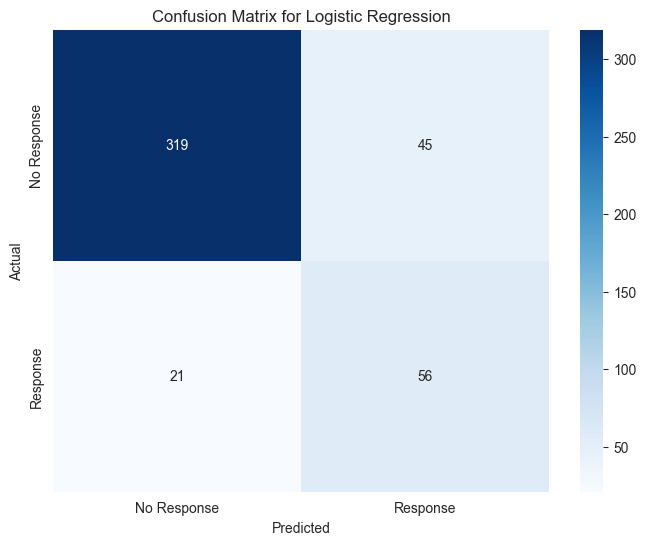

Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.94      0.88      0.91       364
           1       0.55      0.73      0.63        77

    accuracy                           0.85       441
   macro avg       0.75      0.80      0.77       441
weighted avg       0.87      0.85      0.86       441


Evaluation for Random Forest:
    Accuracy: 0.88
    Precision: 0.69
    Recall: 0.56
    F1 Score: 0.62
    ROC-AUC: 0.75



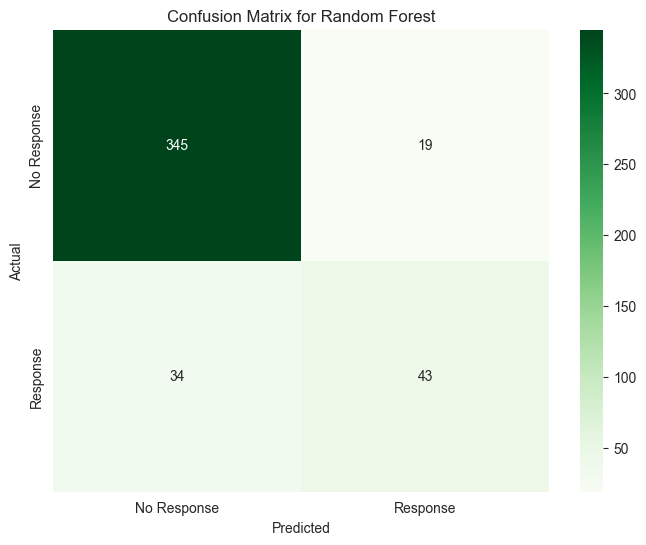

Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.91      0.95      0.93       364
           1       0.69      0.56      0.62        77

    accuracy                           0.88       441
   macro avg       0.80      0.75      0.77       441
weighted avg       0.87      0.88      0.87       441


Evaluation for Artificial Neural Network:
    Accuracy: 0.86
    Precision: 0.63
    Recall: 0.51
    F1 Score: 0.56
    ROC-AUC: 0.72



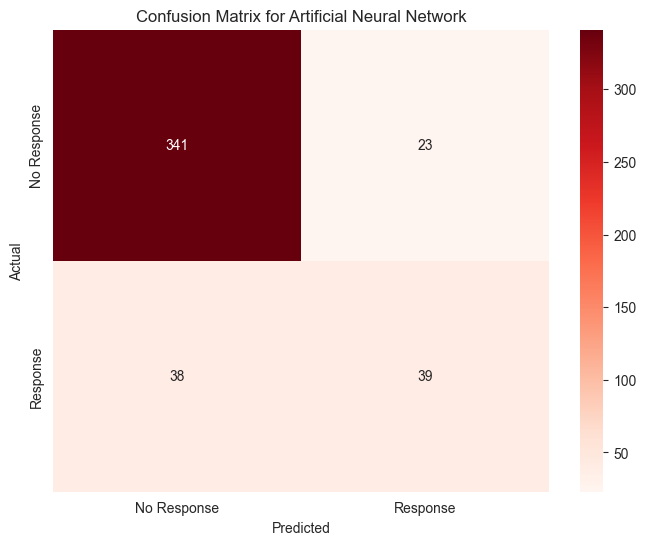

Classification Report for Artificial Neural Network:
              precision    recall  f1-score   support

           0       0.90      0.94      0.92       364
           1       0.63      0.51      0.56        77

    accuracy                           0.86       441
   macro avg       0.76      0.72      0.74       441
weighted avg       0.85      0.86      0.86       441




In [47]:
def evaluate_model(y_test, y_pred, model_name="Model"):
    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)

    # Print metrics
    print(f"Evaluation for {model_name}:")
    print(f"    Accuracy: {accuracy:.2f}")
    print(f"    Precision: {precision:.2f}")
    print(f"    Recall: {recall:.2f}")
    print(f"    F1 Score: {f1:.2f}")
    print(f"    ROC-AUC: {roc_auc:.2f}\n")

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)  
       
    # Plot the confusion matrix as a heatmap
    plt.figure(figsize=(8, 6))
    if model_name.__contains__("Logistic Regression"):
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['No Response', 'Response'], yticklabels=['No Response', 'Response'])
    elif model_name.__contains__("Random Forest"):
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greens', xticklabels=['No Response', 'Response'], yticklabels=['No Response', 'Response'])
    else:
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Reds', xticklabels=['No Response', 'Response'], yticklabels=['No Response', 'Response'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()

    # Classification report for detailed performance metrics
    print(f'Classification Report for {model_name}:')
    print(classification_report(y_test, y_pred))
    print('====================================================================================================================================\n')

evaluate_model(y_test, lr_y_pred, model_name="Logistic Regression")
evaluate_model(y_test, rf_y_pred, model_name="Random Forest")
evaluate_model(y_test, ann_y_pred, model_name="Artificial Neural Network")

The function below performs 5-fold cross-validation on a given model, calculating the mean F1 score to assess performance. The F1 score is chosen for this business problem because it balances precision and recall, making it ideal for predicting customer responses to marketing campaigns where both false positives (targeting non-responders) and false negatives (missing potential responders) are costly. By focusing on F1, we ensure that our model captures as many true responders as possible while minimizing unnecessary outreach, allowing us to select the model that best balances engagement and resource efficiency.

In [48]:
def cross_validate_model(model, model_name):
    if model_name == "Artificial Neural Network":
        # Wrap the ANN model for use with scikit-learn
        ann_keras = KerasClassifier(build_fn=model, epochs=20, batch_size=32, verbose=0) 
        # Perform cross-validation with the ANN model
        mean_f1_score = cross_val_score(ann_keras, X_train, y_train, cv=5, scoring='f1').mean()
        print(f"Artificial Neural Network Mean F1 Score: {mean_f1_score:.2f}")   
    else:
        f1_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='f1')
        mean_f1_score = f1_scores.mean()
        print(f"{model_name} Mean F1 Score: {mean_f1_score:.2f}")
    return mean_f1_score

lr_f1_score = cross_validate_model(lr_model, "Logistic Regression")
rf_f1_score = cross_validate_model(rf_model, "Random Forest")
ann_f1_score = cross_validate_model(ann_model, "Artificial Neural Network")

Logistic Regression Mean F1 Score: 0.57
Random Forest Mean F1 Score: 0.51
Artificial Neural Network Mean F1 Score: 0.61


## Parameter Tuning 

For the parameter tuning part, we have implemented a pipeline combining SMOTE to address class imbalance with Logistic Regression. The pipeline ensures that data preprocessing steps, such as oversampling with SMOTE, are integrated seamlessly into the modeling process, preventing data leakage and maintaining consistency across cross-validation folds. Using GridSearchCV with 5-fold cross-validation, we optimized the model’s F1 score to balance precision and recall.

When evaluated on the test set, the tuned Logistic Regression model achieved an accuracy of 0.84, a precision of 0.54, a recall of 0.71, an F1 score of 0.61, and a ROC-AUC of 0.79. These results indicate the model effectively identifies responders (high recall) while maintaining improved precision compared to the untuned version, resulting in a better balance between false positives and false negatives.

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Parameters: {'model__C': 100, 'model__penalty': 'l2', 'model__solver': 'liblinear'}
Best Mean F1 Score: 0.5971628647633822
Evaluation for Tuned Logistic Regression:
    Accuracy: 0.84
    Precision: 0.54
    Recall: 0.71
    F1 Score: 0.61
    ROC-AUC: 0.79



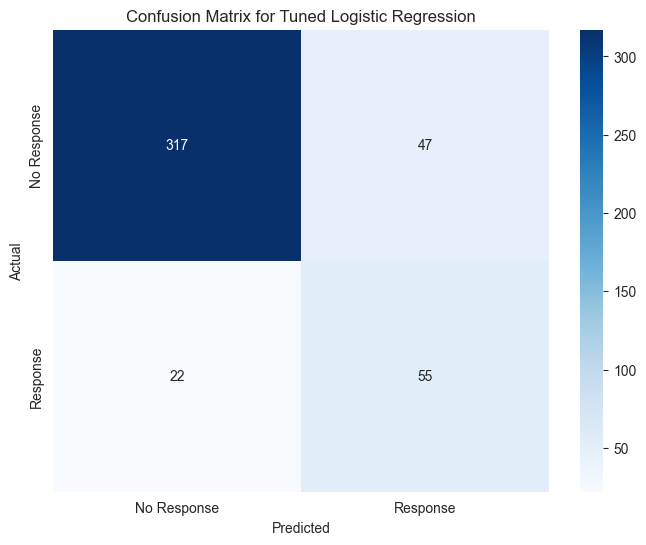

Classification Report for Tuned Logistic Regression:
              precision    recall  f1-score   support

           0       0.94      0.87      0.90       364
           1       0.54      0.71      0.61        77

    accuracy                           0.84       441
   macro avg       0.74      0.79      0.76       441
weighted avg       0.87      0.84      0.85       441




In [49]:
def parameter_tuning_for_lr():
    pipeline = Pipeline([
        ('smote', SMOTE(random_state=42)),
        ('model', LogisticRegression(random_state=42, max_iter=5000))
    ])

    param_grid = {
        'model__C': [0.01, 0.1, 1, 10, 100],
        'model__penalty': ['l2', 'l1'],
        'model__solver': ['liblinear', 'saga']
    }

    grid_search = GridSearchCV(
        estimator=pipeline,
        param_grid=param_grid,
        cv=5,
        scoring='f1',
        n_jobs=-1,
        verbose=1
    )
    
    grid_search.fit(X_train, y_train)

    print("Best Parameters:", grid_search.best_params_)
    print("Best Mean F1 Score:", grid_search.best_score_)

    return grid_search.best_estimator_

tuned_lr_model = parameter_tuning_for_lr()

tuned_lr_y_pred = tuned_lr_model.predict(X_test)

evaluate_model(y_test, tuned_lr_y_pred, model_name="Tuned Logistic Regression")

Next, we implemented a similar pipeline combining SMOTE and a Random Forest model to address class imbalance and explore the effectiveness of ensemble learning for this task. When evaluated on the test set, the tuned Random Forest model achieved an accuracy of 0.87, a precision of 0.64, a recall of 0.62, an F1 score of 0.63, and a ROC-AUC of 0.77. These results show that the Random Forest model performs well in terms of accuracy and generalization while also achieving a better balance between precision and recall compared to the untuned version, as indicated by its improved F1 score.

Fitting 5 folds for each of 300 candidates, totalling 1500 fits
Best Parameters: {'model__max_depth': 10, 'model__min_samples_leaf': 1, 'model__min_samples_split': 7, 'model__n_estimators': 100}
Best Mean F1 Score: 0.5871899121648145
Evaluation for Tuned Random Forest:
    Accuracy: 0.87
    Precision: 0.64
    Recall: 0.62
    F1 Score: 0.63
    ROC-AUC: 0.77



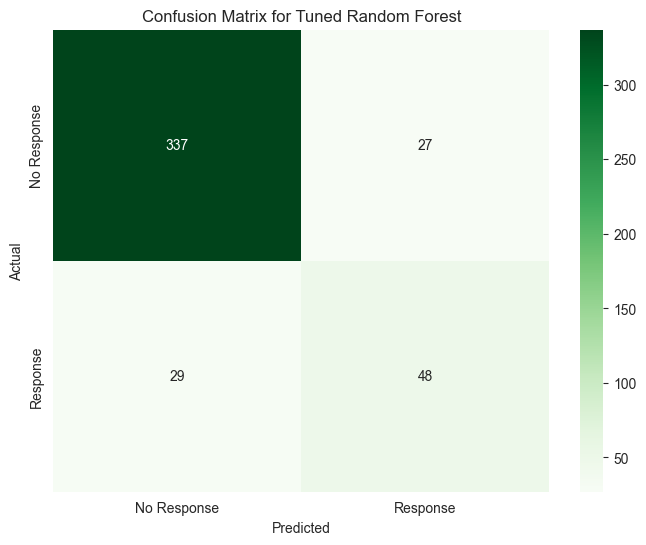

Classification Report for Tuned Random Forest:
              precision    recall  f1-score   support

           0       0.92      0.93      0.92       364
           1       0.64      0.62      0.63        77

    accuracy                           0.87       441
   macro avg       0.78      0.77      0.78       441
weighted avg       0.87      0.87      0.87       441




In [50]:
def parameter_tuning_for_rf():
    pipeline = Pipeline([
        ('smote', SMOTE(random_state=42)),  
        ('model', RandomForestClassifier(random_state=42))  
    ])

    param_grid = {
        'model__n_estimators': [100, 150, 200, 250, 300],    # Number of trees in the forest
        'model__max_depth': [None, 5, 10, 15, 20],        # Maximum depth of the tree
        'model__min_samples_split': [2, 5, 7, 10],        # Minimum samples required to split an internal node
        'model__min_samples_leaf': [1, 2, 3]          # Minimum samples required to be a leaf node
    }

    grid_search = GridSearchCV(
        estimator=pipeline,
        param_grid=param_grid,
        cv=5,
        scoring='f1',
        n_jobs=-1,
        verbose=1
    )

    grid_search.fit(X_train, y_train)

    print("Best Parameters:", grid_search.best_params_)
    print("Best Mean F1 Score:", grid_search.best_score_)

    return grid_search.best_estimator_

tuned_rf_model = parameter_tuning_for_rf()

tuned_rf_y_pred = tuned_rf_model.predict(X_test)

evaluate_model(y_test, tuned_rf_y_pred, model_name="Tuned Random Forest")

Finally, we applied the pipeline and hyperparameter tuning to the ANN model, which combines the flexibility of deep learning with SMOTE to address class imbalance. Using GridSearchCV with 5-fold cross-validation, we optimized the ANN model’s key hyperparameters, including learning rate, activation function, and the number of neurons in each hidden layer. 

When evaluated on the test set, the tuned ANN model achieved an accuracy of 0.88, a precision of 0.73, a recall of 0.49, an F1 score of 0.59, and a ROC-AUC of 0.73. These results highlight the ANN model’s strong precision, reducing false positives, but its relatively lower recall indicates challenges in identifying all potential responders. While the ANN maintains a balanced F1 score, it is less robust in recall compared to other models, making it effective but not the most reliable for this task.

Fitting 5 folds for each of 486 candidates, totalling 2430 fits


2024-11-10 19:43:36.765618: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: INVALID_ARGUMENT: Expected tensor of type int64 but got type float
	 [[{{function_node __inference_one_step_on_data_124509}}{{node adam/Add_8}}]]
2024-11-10 19:43:39.729286: W tensorflow/core/framework/op_kernel.cc:1841] OP_REQUIRES failed at resource_variable_ops.cc:620 : INVALID_ARGUMENT: Cannot update variable with shape [32,1] using a Tensor with shape [32,0], shapes must be equal.
2024-11-10 19:43:39.729355: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: INVALID_ARGUMENT: Cannot update variable with shape [32,1] using a Tensor with shape [32,0], shapes must be equal.
	 [[{{function_node __inference_one_step_on_data_137093}}{{node adam/AssignSubVariableOp_4}}]]
2024-11-10 19:45:20.256291: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: INVALID_ARGUMENT: Incompatible s

Best Parameters: {'model__batch_size': 32, 'model__epochs': 30, 'model__model__activation': 'tanh', 'model__model__dense_1_units': 128, 'model__model__dense_2_units': 64, 'model__model__learning_rate': 0.001}
Evaluation for Tuned Artificial Neural Network:
    Accuracy: 0.88
    Precision: 0.73
    Recall: 0.49
    F1 Score: 0.59
    ROC-AUC: 0.73



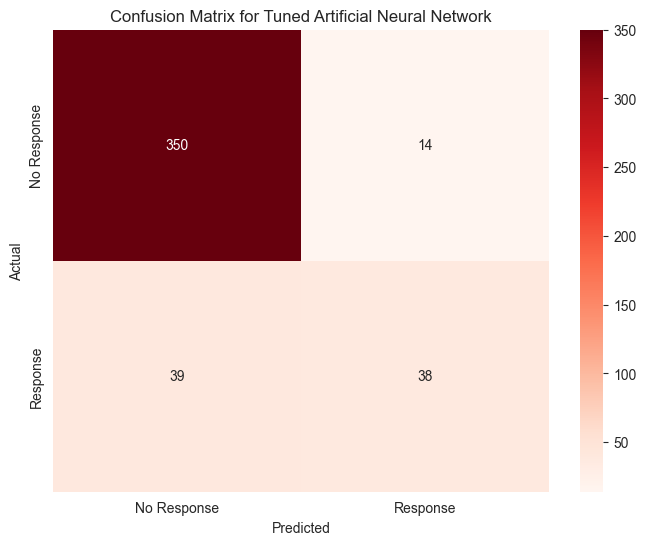

Classification Report for Tuned Artificial Neural Network:
              precision    recall  f1-score   support

           0       0.90      0.96      0.93       364
           1       0.73      0.49      0.59        77

    accuracy                           0.88       441
   macro avg       0.82      0.73      0.76       441
weighted avg       0.87      0.88      0.87       441




In [51]:
def parameter_tuning_for_ann():
    # Wrap the ANN model
    ann_model = KerasClassifier(
        model=create_ann_model,
        verbose=0  # Suppress verbose output during training
    )

    param_grid = {
        'model__model__learning_rate': [0.001, 0.01, 0.1],       # Learning rates
        'model__model__activation': ['relu', 'tanh'],            # Activation functions
        'model__model__dense_1_units': [32, 64, 128],            # Units in the first dense layer
        'model__model__dense_2_units': [16, 32, 64],             # Units in the second dense layer
        'model__batch_size': [16, 32, 64],                       # Batch sizes
        'model__epochs': [10, 20, 30]                            # Number of epochs
    }  

    # Create pipeline with SMOTE
    pipeline = Pipeline([
        ('smote', SMOTE(random_state=42)),  # Handle class imbalance
        ('model', ann_model)               # ANN as the model
    ])

    # Perform GridSearchCV
    grid_search = GridSearchCV(
        estimator=pipeline,
        param_grid=param_grid,
        cv=5,  # 5-fold cross-validation
        scoring='f1',  # Optimize for F1 score
        n_jobs=-1,  # Use all available processors
        verbose=1
    )

    # Fit the grid search to the training data
    grid_search.fit(X_train, y_train)

    # Print the best parameters and the best F1 score
    print("Best Parameters:", grid_search.best_params_)

    return grid_search.best_estimator_


# Use the best model from GridSearchCV
tuned_ann_model = parameter_tuning_for_ann()

# Predict on the test set
tuned_ann_y_pred = tuned_ann_model.predict(X_test)

# Evaluate the tuned ANN model
evaluate_model(y_test, tuned_ann_y_pred, model_name="Tuned Artificial Neural Network")

## Conclusion

In this analysis, we evaluated three models: Logistic Regression, Random Forest and Artificial Neural Network (ANN), to predict customer responses effectively. Each model demonstrated unique strengths, with Random Forest achieving the highest F1 score (0.63) after parameter tuning, showcasing a strong balance between precision and recall.

The integration of SMOTE within the pipelines effectively addressed class imbalance, ensuring robust training and consistent evaluation across all models. While the ANN model exhibited high precision (0.73) and strong accuracy (0.88), its lower recall made it less effective at identifying all potential responders. Logistic Regression, on the other hand, provided a competitive F1 score (0.61) with reliable recall, making it a strong candidate for scenarios prioritizing responder identification.

These results highlight the importance of combining advanced modeling techniques with thoughtful preprocessing and hyperparameter tuning to achieve optimal performance in predicting customer responses.